In [1]:
#coding=utf-8
# standard library
import gc
import importlib
import os
import sys
import pickle
import socket
import statistics
import struct
import time
from datetime import datetime

# pip3 library
import psutil
import scipy
import tqdm
import numpy as np
import pandas as pd
import sklearn.cluster as cluster
import xgboost as xgb

# custom functions
import matplotlib.pyplot as plt
import gan_func
importlib.reload(gan_func)  # For reloading after making changes
from gan_func import *
plt.style.use('ggplot')     # select plt style

Using TensorFlow backend.


-------------------------
Check memory
[472806289408, 466227769344]
[472806289408, 466227515392]
-------------------------
Load Dataset
cnt         3.049122
times    5555.474785
dtype: float64 cnt         2.837266
times    5121.499774
dtype: float64
   count
0   5016
1    338
Data preprocessing finish
Start to setting GAN


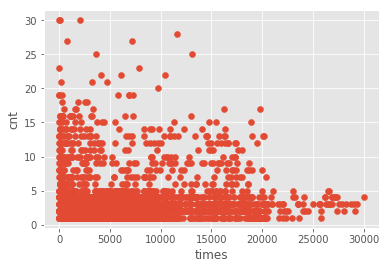

In [2]:
# collect trash and check memory
check_memory()

# Load engineered dataset from EDA section
dataSample = pd.read_csv('client.csv')
dataSample_o = pd.read_csv('../server_cnt/server.csv')
print('Load Dataset')
label_cols = ['Class']

# save traffic
normalized_dataSample = (dataSample - dataSample.mean()) / dataSample.std()
normalized_dataSample_o = (dataSample_o - dataSample_o.mean()) / dataSample_o.std()
data_cols = ['times', 'cnt']
print(dataSample.mean(), dataSample.std())
train = normalized_dataSample.copy()
train_o = normalized_dataSample_o.copy()
labels = cluster.KMeans(n_clusters=2, random_state=0).fit_predict(train[data_cols])
print(pd.DataFrame([[np.sum(labels == i)] for i in np.unique(labels)], columns=['count'], index=np.unique(labels)))
print('Data preprocessing finish')


# Generate arguments and training the GAN and WGAN architectures, WGAN are use WGAN-GP
print('Start to setting GAN')
fraud_w_classes = train.copy()

# print the original data figure
origin = dataSample.values.copy()
x2 = origin[:, 1]
y2 = origin[:, 0]
plt.scatter(x2, y2)
plt.xlabel('times')
plt.ylabel('cnt')
plt.show()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 32)           0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 2)            0                                            
__________________________________________________________________________________________________
concatenate_1 (Concatenate)     (None, 34)           0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 128)          4480        concatenate_1[0][0]              
__________

Step: 0 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0327, -0.0288, 0.0458, 0.9390
D Real - D Gen: 0.0746


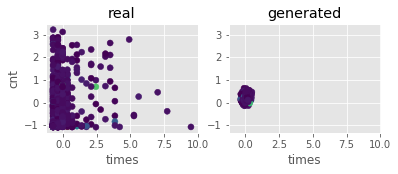

Step: 100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0729, -0.0523, 0.1574, 0.9910
D Real - D Gen: 0.2097


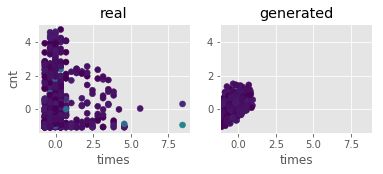

Step: 200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0837, -0.0650, -0.0428, 0.9760
D Real - D Gen: 0.0221


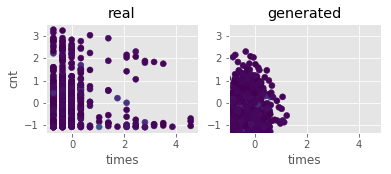

Step: 300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0885, -0.1353, -0.0924, 0.9770
D Real - D Gen: 0.0429


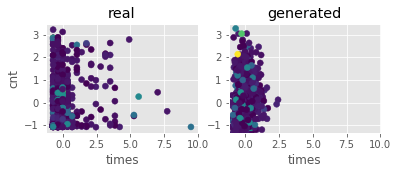

Step: 400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0692, -0.0425, -0.0160, 0.9800
D Real - D Gen: 0.0265


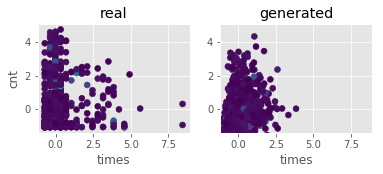

Step: 500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0522, -0.0450, -0.0377, 0.9550
D Real - D Gen: 0.0073


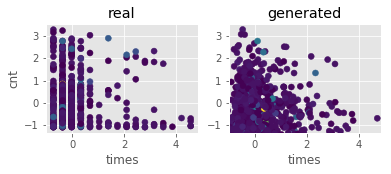

Step: 600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0571, -0.0287, -0.0191, 0.9510
D Real - D Gen: 0.0096


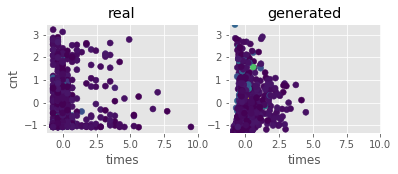

Step: 700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0636, -0.0460, -0.0274, 0.9630
D Real - D Gen: 0.0186


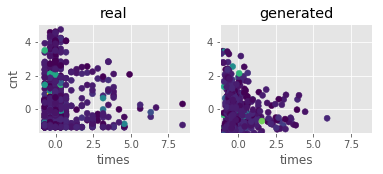

Step: 800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0735, -0.0735, -0.0402, 0.9320
D Real - D Gen: 0.0333


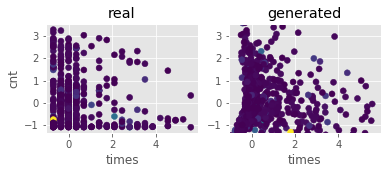

Step: 900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0996, -0.0894, -0.1024, 0.9600
D Real - D Gen: -0.0129


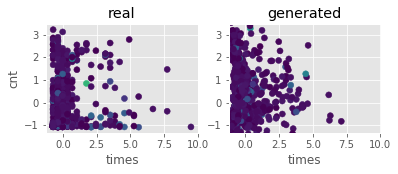

Step: 1000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1091, -0.1127, -0.1000, 0.9530
D Real - D Gen: 0.0127


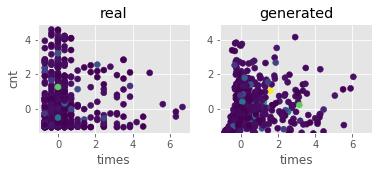

Step: 1100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0808, -0.0834, -0.0644, 0.9180
D Real - D Gen: 0.0191


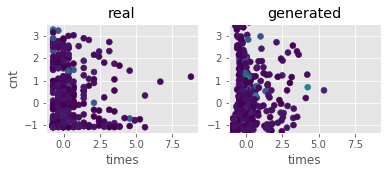

Step: 1200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0890, -0.0965, -0.0739, 0.9480
D Real - D Gen: 0.0226


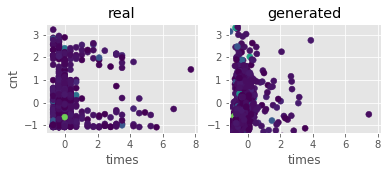

Step: 1300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1650, -0.1220, -0.0947, 0.9560
D Real - D Gen: 0.0272


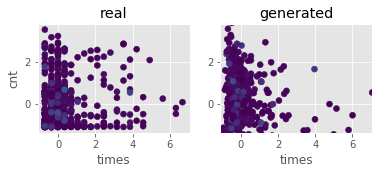

Step: 1400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1090, -0.1127, -0.0212, 0.9450
D Real - D Gen: 0.0915


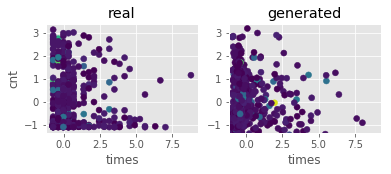

Step: 1500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1553, -0.1484, -0.1158, 0.9550
D Real - D Gen: 0.0326


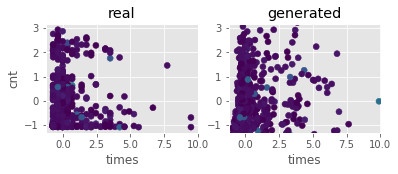

Step: 1600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0987, -0.1544, -0.1286, 0.9490
D Real - D Gen: 0.0258


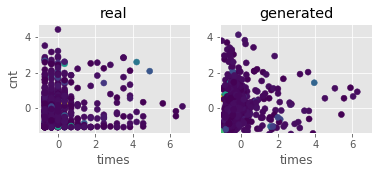

Step: 1700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0843, -0.0922, -0.0868, 0.9620
D Real - D Gen: 0.0054


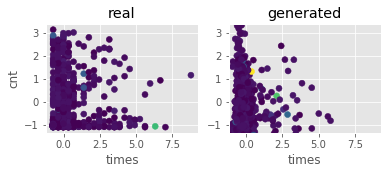

Step: 1800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1020, -0.1237, -0.0995, 0.9640
D Real - D Gen: 0.0242


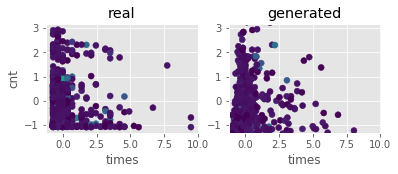

Step: 1900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1012, -0.0963, -0.0410, 0.9710
D Real - D Gen: 0.0553


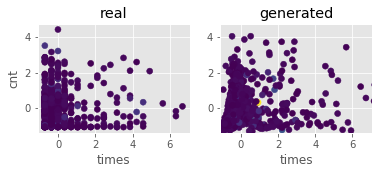

Step: 2000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2011, -0.2020, -0.1625, 0.9430
D Real - D Gen: 0.0395


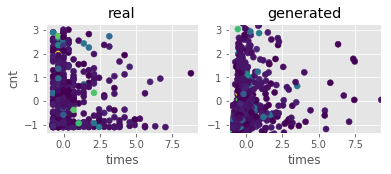

Step: 2100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1340, -0.1324, -0.1072, 0.9550
D Real - D Gen: 0.0252


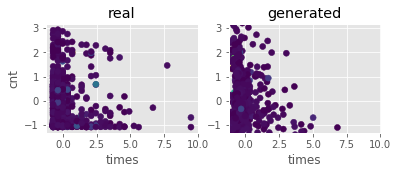

Step: 2200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0816, -0.0921, -0.0556, 0.9550
D Real - D Gen: 0.0365


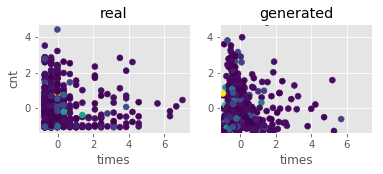

Step: 2300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1258, -0.1632, -0.1592, 0.9570
D Real - D Gen: 0.0040


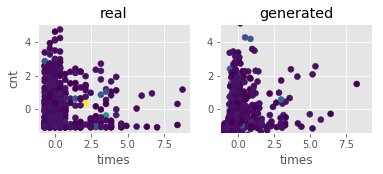

Step: 2400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0936, -0.0957, -0.0851, 0.9290
D Real - D Gen: 0.0106


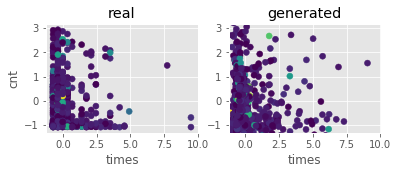

Step: 2500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1622, -0.1752, -0.1309, 0.9480
D Real - D Gen: 0.0443


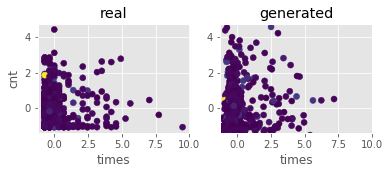

Step: 2600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2025, -0.1345, -0.1065, 0.9490
D Real - D Gen: 0.0281


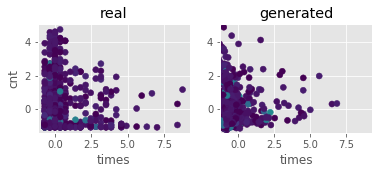

Step: 2700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0982, -0.1242, -0.0998, 0.9590
D Real - D Gen: 0.0244


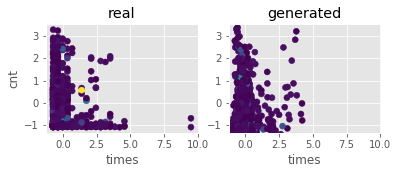

Step: 2800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0729, -0.0880, -0.0541, 0.9460
D Real - D Gen: 0.0339


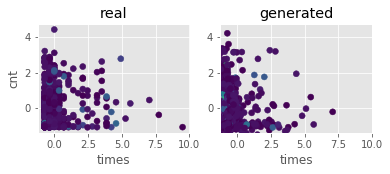

Step: 2900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1479, -0.1396, -0.1130, 0.9550
D Real - D Gen: 0.0266


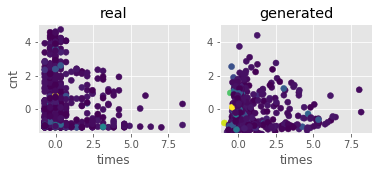

Step: 3000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1589, -0.2083, -0.2416, 0.9220
D Real - D Gen: -0.0333


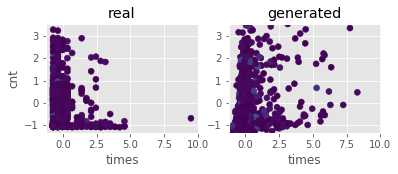

Step: 3100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0847, -0.0718, -0.1205, 0.9410
D Real - D Gen: -0.0487


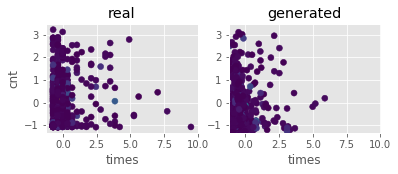

Step: 3200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0475, -0.0576, -0.0249, 0.9630
D Real - D Gen: 0.0326


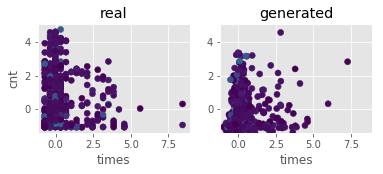

Step: 3300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1361, -0.0835, -0.1005, 0.9730
D Real - D Gen: -0.0170


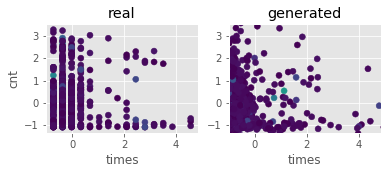

Step: 3400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1022, -0.0774, -0.0643, 0.9740
D Real - D Gen: 0.0131


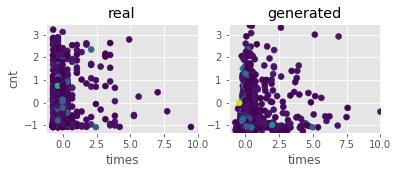

Step: 3500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1515, -0.1456, -0.1344, 0.9280
D Real - D Gen: 0.0112


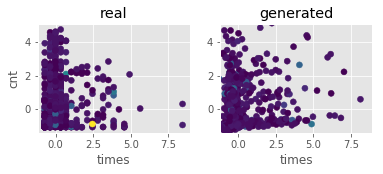

Step: 3600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0934, -0.1214, -0.1244, 0.9470
D Real - D Gen: -0.0030


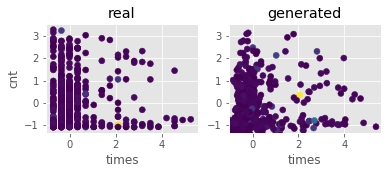

Step: 3700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0731, -0.0431, -0.0256, 0.9690
D Real - D Gen: 0.0175


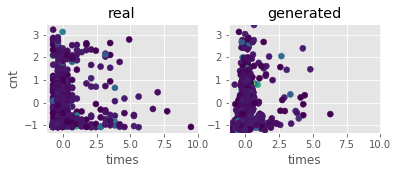

Step: 3800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0520, -0.0395, -0.0502, 0.9550
D Real - D Gen: -0.0107


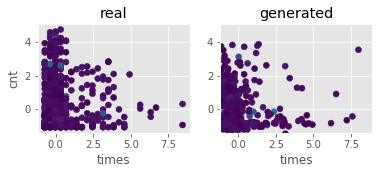

Step: 3900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0852, -0.0774, -0.0804, 0.9290
D Real - D Gen: -0.0030


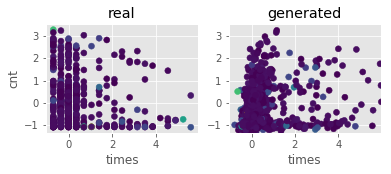

Step: 4000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1539, -0.2137, -0.2075, 0.9330
D Real - D Gen: 0.0062


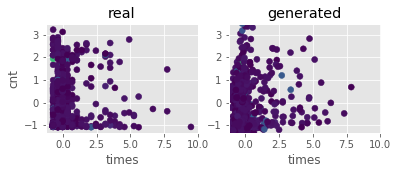

Step: 4100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1303, -0.1374, -0.1333, 0.9550
D Real - D Gen: 0.0040


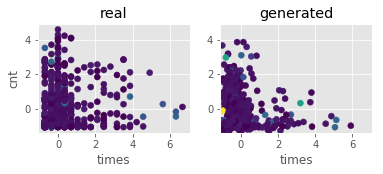

Step: 4200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0837, -0.1348, -0.1454, 0.9540
D Real - D Gen: -0.0107


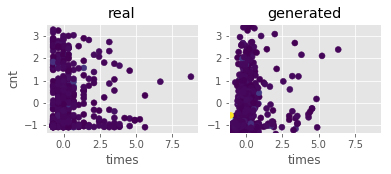

Step: 4300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0768, -0.0883, -0.0850, 0.9280
D Real - D Gen: 0.0033


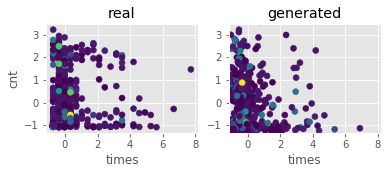

Step: 4400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0342, -0.0055, -0.0191, 0.9300
D Real - D Gen: -0.0136


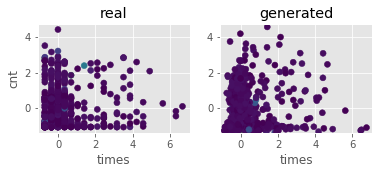

Step: 4500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1134, -0.0945, -0.1225, 0.9150
D Real - D Gen: -0.0280


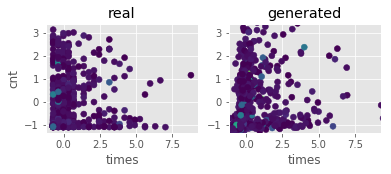

Step: 4600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1616, -0.1146, -0.1250, 0.9580
D Real - D Gen: -0.0105


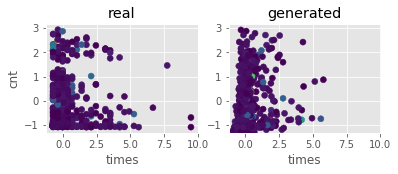

Step: 4700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0266, -0.0255, -0.0288, 0.9550
D Real - D Gen: -0.0033


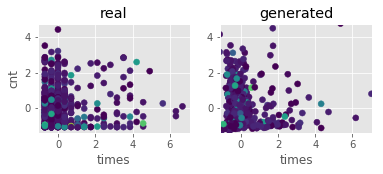

Step: 4800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0260, -0.0397, -0.0292, 0.9290
D Real - D Gen: 0.0104


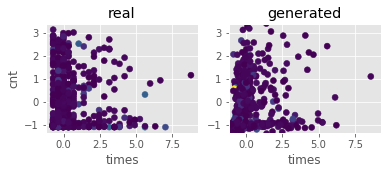

Step: 4900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0012, -0.0033, 0.0145, 0.9640
D Real - D Gen: 0.0178


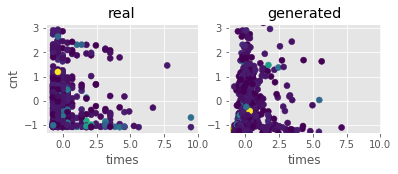

Step: 5000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0982, -0.0562, -0.0513, 0.9190
D Real - D Gen: 0.0049


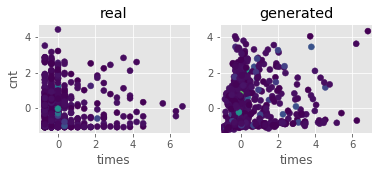

Step: 5100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0830, -0.0540, -0.0421, 0.9650
D Real - D Gen: 0.0119


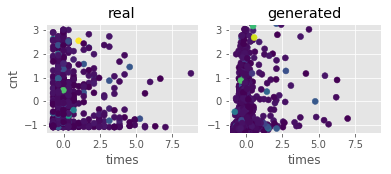

Step: 5200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0473, 0.0029, 0.0149, 0.9440
D Real - D Gen: 0.0120


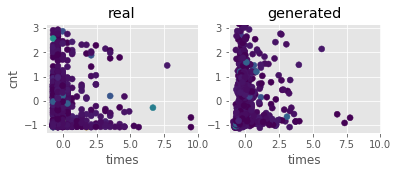

Step: 5300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0003, -0.0107, -0.0027, 0.9670
D Real - D Gen: 0.0080


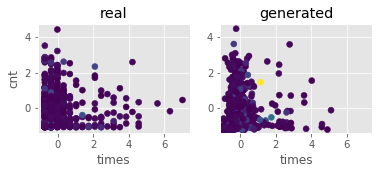

Step: 5400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0281, 0.0000, 0.0080, 0.9500
D Real - D Gen: 0.0079


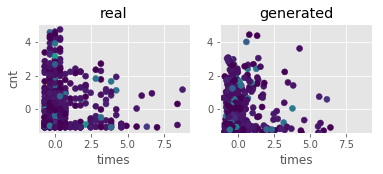

Step: 5500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0096, 0.0013, 0.0125, 0.9770
D Real - D Gen: 0.0112


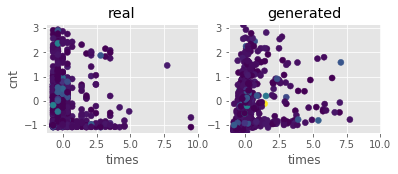

Step: 5600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0151, 0.0158, 0.0123, 0.9510
D Real - D Gen: -0.0036


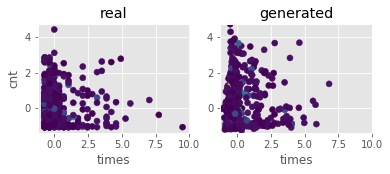

Step: 5700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0612, 0.0696, 0.0798, 0.9480
D Real - D Gen: 0.0102


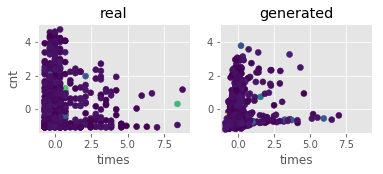

Step: 5800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0214, 0.0201, 0.0404, 0.9520
D Real - D Gen: 0.0203


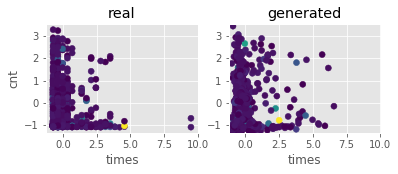

Step: 5900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0080, 0.0130, -0.0656, 0.9420
D Real - D Gen: -0.0787


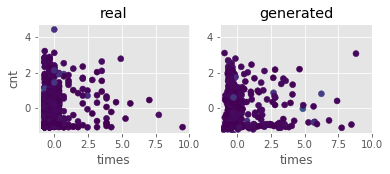

Step: 6000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0960, 0.0684, 0.1200, 0.9590
D Real - D Gen: 0.0516


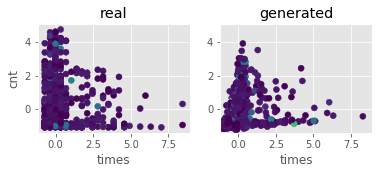

Step: 6100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0320, -0.0172, -0.0349, 0.9700
D Real - D Gen: -0.0176


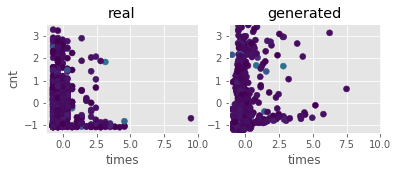

Step: 6200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1280, 0.1042, 0.1242, 0.9590
D Real - D Gen: 0.0200


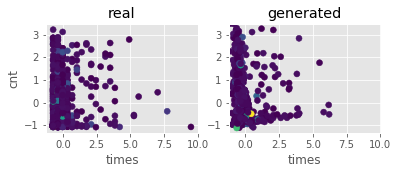

Step: 6300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2284, 0.1967, 0.2045, 0.9630
D Real - D Gen: 0.0078


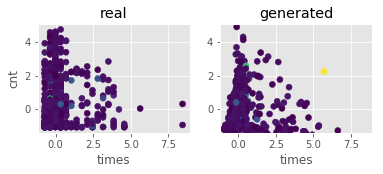

Step: 6400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0590, 0.0756, 0.0807, 0.9650
D Real - D Gen: 0.0051


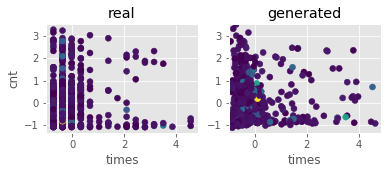

Step: 6500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0789, 0.0768, 0.0819, 0.9690
D Real - D Gen: 0.0052


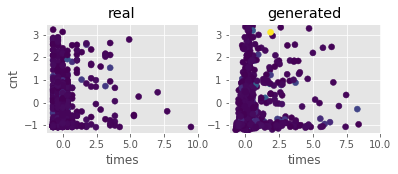

Step: 6600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1003, 0.1044, 0.1027, 0.9490
D Real - D Gen: -0.0017


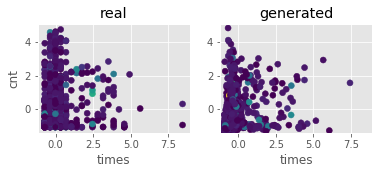

Step: 6700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1067, 0.1162, 0.1212, 0.9440
D Real - D Gen: 0.0050


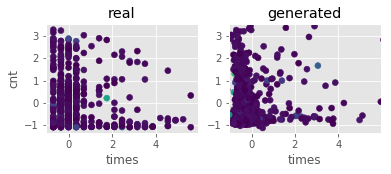

Step: 6800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1650, 0.1538, 0.2022, 0.9630
D Real - D Gen: 0.0484


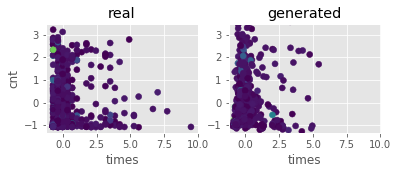

Step: 6900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1258, 0.1250, 0.1305, 0.9470
D Real - D Gen: 0.0055


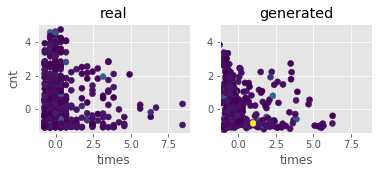

Step: 7000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1537, 0.1877, 0.2017, 0.9360
D Real - D Gen: 0.0140


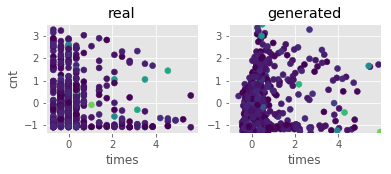

Step: 7100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1672, 0.1779, 0.1840, 0.9320
D Real - D Gen: 0.0061


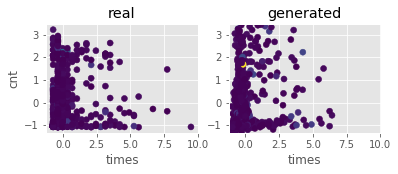

Step: 7200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1444, 0.2018, 0.1565, 0.9650
D Real - D Gen: -0.0453


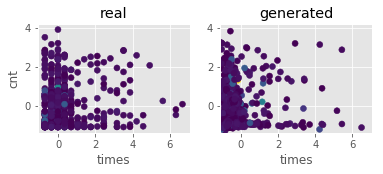

Step: 7300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2224, 0.2226, 0.2066, 0.9130
D Real - D Gen: -0.0160


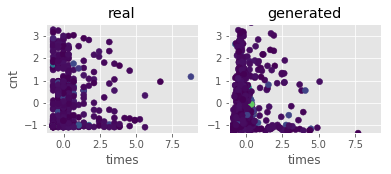

Step: 7400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1964, 0.1924, 0.1854, 0.9320
D Real - D Gen: -0.0070


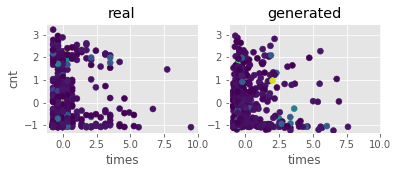

Step: 7500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1997, 0.1894, 0.1900, 0.9390
D Real - D Gen: 0.0006


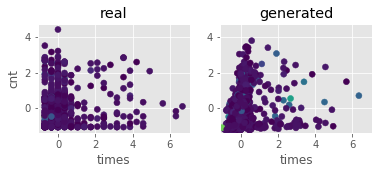

Step: 7600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1761, 0.1493, 0.1796, 0.9440
D Real - D Gen: 0.0304


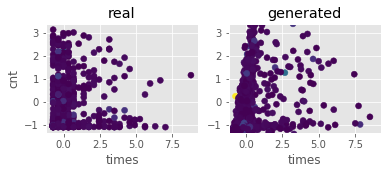

Step: 7700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1999, 0.1884, 0.2025, 0.9500
D Real - D Gen: 0.0141


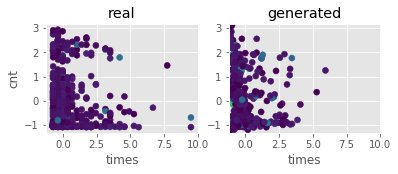

Step: 7800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2511, 0.2587, 0.2649, 0.9720
D Real - D Gen: 0.0062


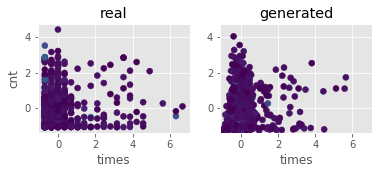

Step: 7900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1744, 0.1572, 0.1550, 0.9500
D Real - D Gen: -0.0022


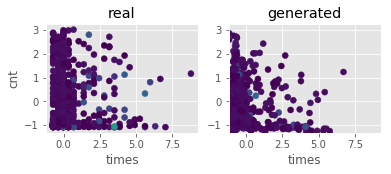

Step: 8000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2095, 0.2169, 0.2065, 0.9640
D Real - D Gen: -0.0104


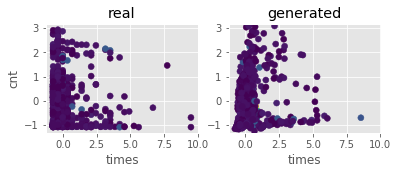

Step: 8100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1582, 0.1626, 0.1647, 0.9420
D Real - D Gen: 0.0021


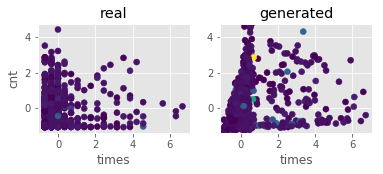

Step: 8200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0916, 0.0810, 0.0988, 0.9670
D Real - D Gen: 0.0178


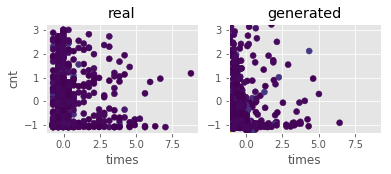

Step: 8300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1785, 0.1908, 0.1930, 0.9680
D Real - D Gen: 0.0022


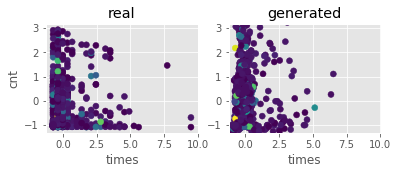

Step: 8400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2154, 0.2246, 0.2342, 0.9470
D Real - D Gen: 0.0096


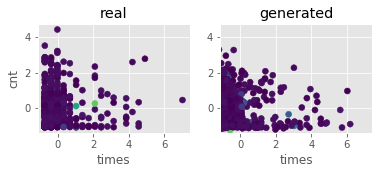

Step: 8500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2884, 0.2776, 0.2954, 0.9450
D Real - D Gen: 0.0178


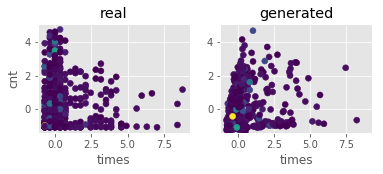

Step: 8600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2833, 0.2654, 0.2639, 0.9670
D Real - D Gen: -0.0015


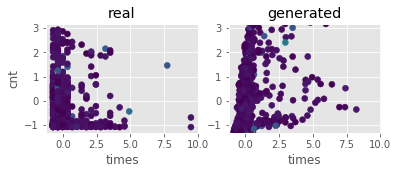

Step: 8700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2050, 0.2269, 0.2435, 0.9410
D Real - D Gen: 0.0167


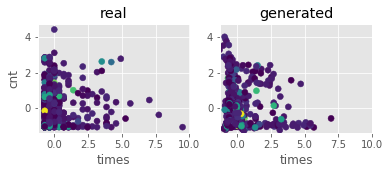

Step: 8800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2312, 0.1973, 0.1663, 0.9640
D Real - D Gen: -0.0310


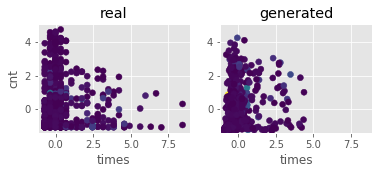

Step: 8900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2020, 0.2007, 0.2060, 0.9560
D Real - D Gen: 0.0053


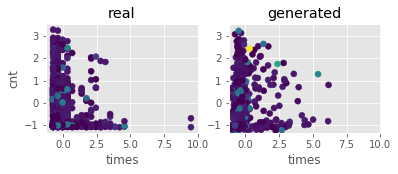

Step: 9000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2400, 0.2414, 0.2465, 0.9420
D Real - D Gen: 0.0050


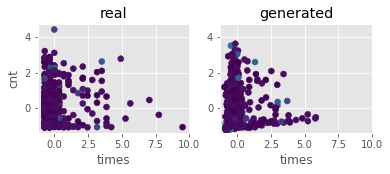

Step: 9100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3359, 0.3232, 0.3240, 0.9410
D Real - D Gen: 0.0008


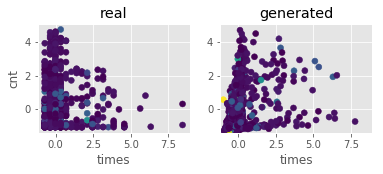

Step: 9200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1013, 0.0884, 0.1033, 0.9460
D Real - D Gen: 0.0149


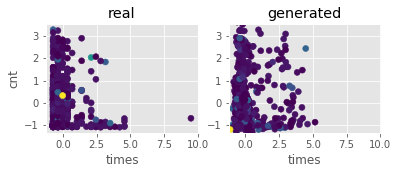

Step: 9300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1884, 0.1716, 0.1895, 0.9680
D Real - D Gen: 0.0179


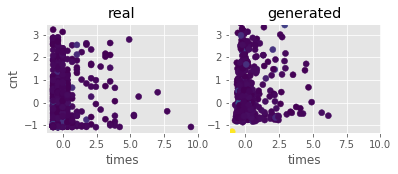

Step: 9400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2781, 0.2738, 0.2886, 0.9410
D Real - D Gen: 0.0148


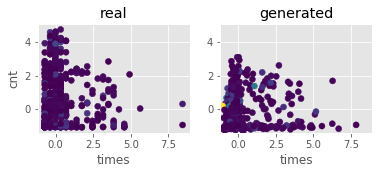

Step: 9500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3057, 0.3098, 0.3137, 0.9470
D Real - D Gen: 0.0039


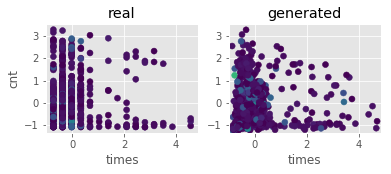

Step: 9600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3944, 0.4207, 0.3898, 0.9650
D Real - D Gen: -0.0309


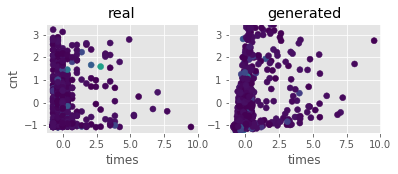

Step: 9700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1327, 0.1278, 0.1215, 0.9430
D Real - D Gen: -0.0063


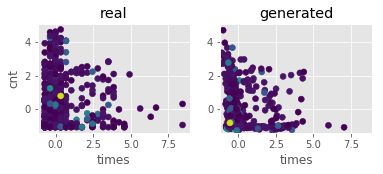

Step: 9800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1911, 0.2154, 0.2247, 0.9690
D Real - D Gen: 0.0093


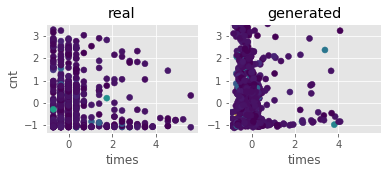

Step: 9900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2237, 0.1960, 0.1954, 0.9330
D Real - D Gen: -0.0006


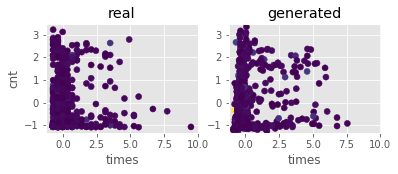

Step: 10000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2304, 0.2308, 0.2213, 0.9440
D Real - D Gen: -0.0095


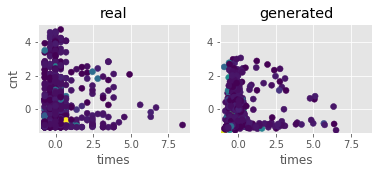

Step: 10100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3363, 0.3129, 0.4078, 0.9440
D Real - D Gen: 0.0949


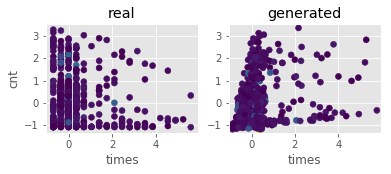

Step: 10200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1415, 0.1479, 0.1500, 0.9350
D Real - D Gen: 0.0021


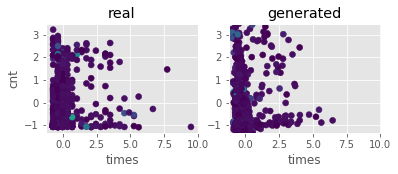

Step: 10300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2569, 0.2732, 0.2797, 0.9600
D Real - D Gen: 0.0065


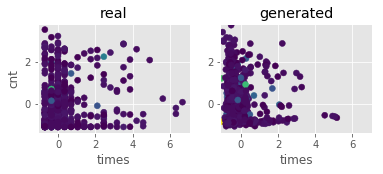

Step: 10400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3173, 0.3172, 0.3111, 0.9250
D Real - D Gen: -0.0061


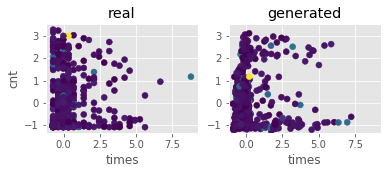

Step: 10500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2254, 0.2410, 0.2286, 0.9450
D Real - D Gen: -0.0123


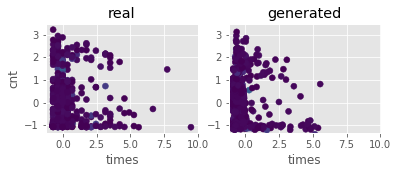

Step: 10600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3547, 0.3140, 0.3600, 0.9730
D Real - D Gen: 0.0460


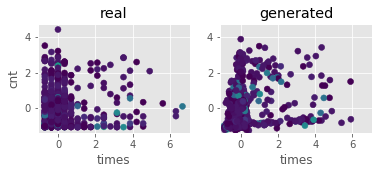

Step: 10700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2353, 0.2534, 0.2629, 0.9510
D Real - D Gen: 0.0095


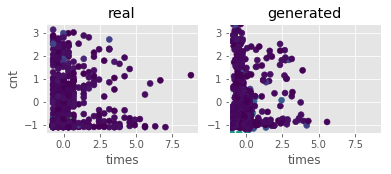

Step: 10800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3454, 0.3339, 0.3340, 0.9390
D Real - D Gen: 0.0001


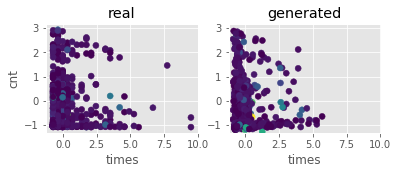

Step: 10900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4305, 0.4400, 0.4782, 0.9530
D Real - D Gen: 0.0382


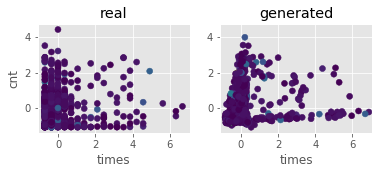

Step: 11000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2010, 0.1798, 0.1912, 0.9520
D Real - D Gen: 0.0114


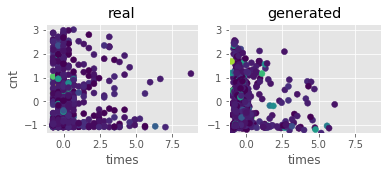

Step: 11100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1826, 0.1881, 0.1818, 0.9600
D Real - D Gen: -0.0062


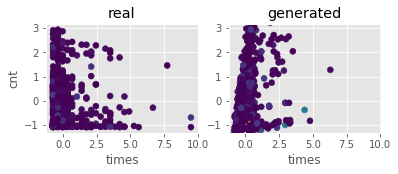

Step: 11200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2426, 0.2507, 0.2751, 0.9490
D Real - D Gen: 0.0245


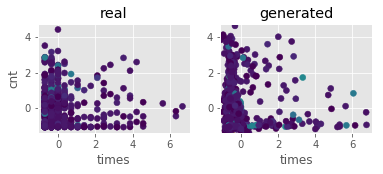

Step: 11300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2448, 0.2414, 0.2368, 0.9590
D Real - D Gen: -0.0046


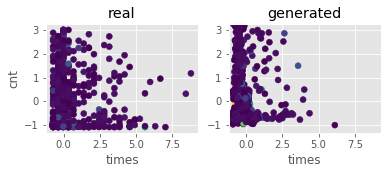

Step: 11400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4179, 0.4426, 0.4547, 0.9510
D Real - D Gen: 0.0121


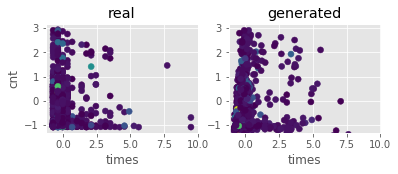

Step: 11500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2017, 0.2037, 0.2047, 0.9570
D Real - D Gen: 0.0010


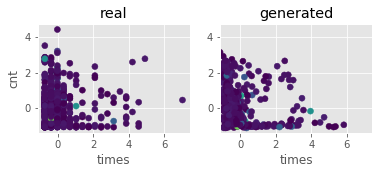

Step: 11600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.4087, 0.4007, 0.3848, 0.9530
D Real - D Gen: -0.0159


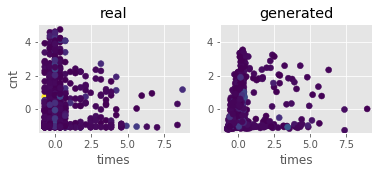

Step: 11700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1767, 0.1980, 0.1003, 0.9630
D Real - D Gen: -0.0978


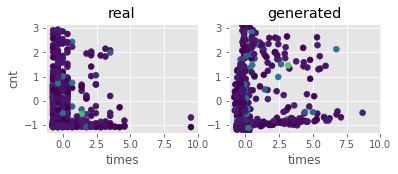

Step: 11800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2795, 0.2693, 0.2785, 0.9630
D Real - D Gen: 0.0092


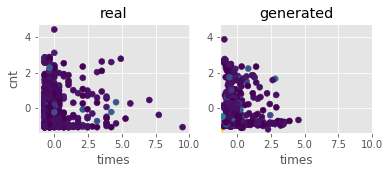

Step: 11900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3608, 0.3599, 0.3657, 0.9630
D Real - D Gen: 0.0059


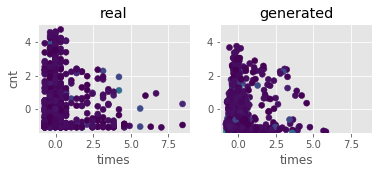

Step: 12000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1674, 0.1890, 0.2010, 0.9600
D Real - D Gen: 0.0120


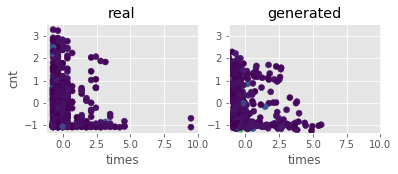

Step: 12100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2767, 0.2809, 0.2762, 0.9500
D Real - D Gen: -0.0048


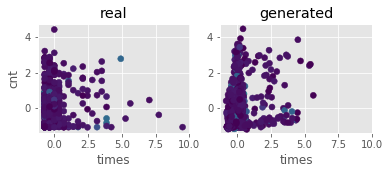

Step: 12200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2078, 0.1957, 0.1988, 0.9400
D Real - D Gen: 0.0032


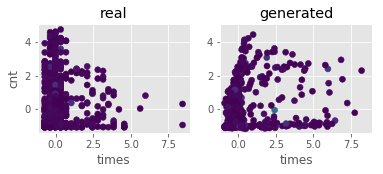

Step: 12300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2270, 0.1884, 0.1698, 0.9630
D Real - D Gen: -0.0186


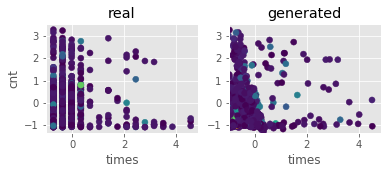

Step: 12400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1697, 0.1469, 0.1545, 0.9550
D Real - D Gen: 0.0077


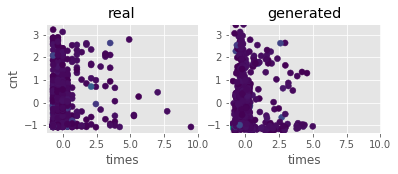

Step: 12500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2469, 0.2547, 0.2391, 0.9470
D Real - D Gen: -0.0156


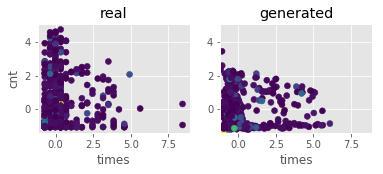

Step: 12600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2585, 0.2544, 0.2745, 0.9590
D Real - D Gen: 0.0201


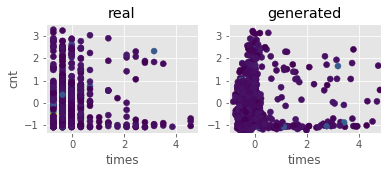

Step: 12700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2475, 0.2553, 0.2684, 0.9610
D Real - D Gen: 0.0131


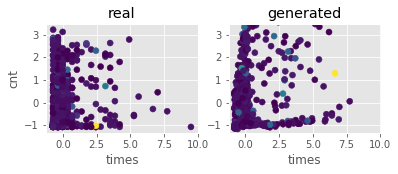

Step: 12800 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2201, 0.2062, 0.1915, 0.9640
D Real - D Gen: -0.0147


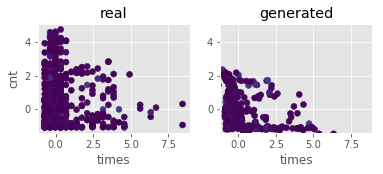

Step: 12900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2717, 0.2773, 0.2894, 0.9420
D Real - D Gen: 0.0121


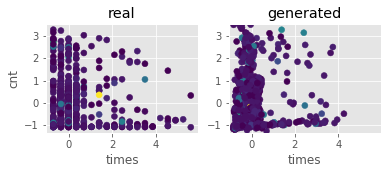

Step: 13000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2006, 0.2020, 0.1956, 0.9470
D Real - D Gen: -0.0063


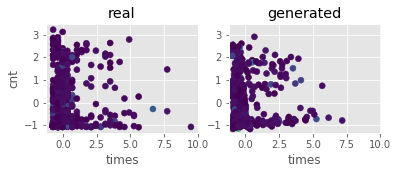

Step: 13100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2750, 0.2555, 0.2767, 0.9480
D Real - D Gen: 0.0212


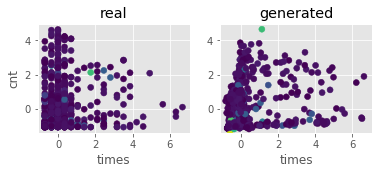

Step: 13200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.3058, 0.2923, 0.2862, 0.9160
D Real - D Gen: -0.0061


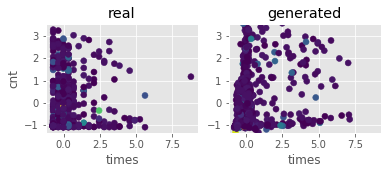

Step: 13300 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0088, 0.0922, 0.0892, 0.9350
D Real - D Gen: -0.0030


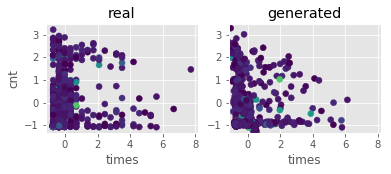

Step: 13400 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2074, 0.2316, 0.2267, 0.9640
D Real - D Gen: -0.0049


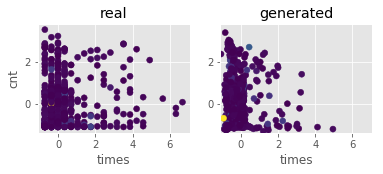

Step: 13500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.2117, 0.2490, 0.2441, 0.9260
D Real - D Gen: -0.0049


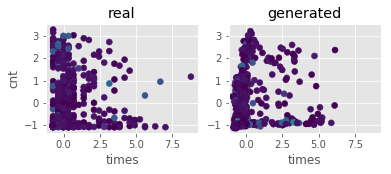

Step: 13600 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0526, 0.0230, 0.0360, 0.9600
D Real - D Gen: 0.0130


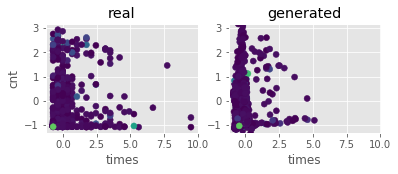

Step: 13700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1345, 0.1286, 0.1248, 0.9500
D Real - D Gen: -0.0038


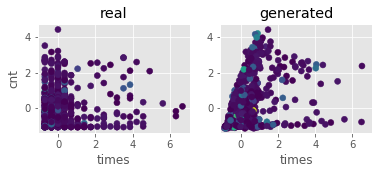

Step: 13800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1451, -0.1461, -0.1329, 0.9690
D Real - D Gen: 0.0132


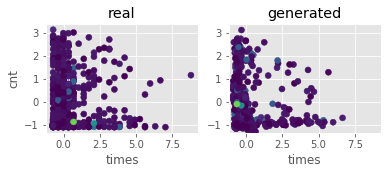

Step: 13900 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0098, 0.0182, 0.0276, 0.9630
D Real - D Gen: 0.0093


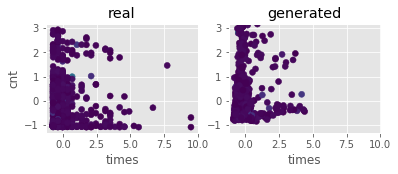

Step: 14000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0112, 0.0100, 0.0226, 0.9610
D Real - D Gen: 0.0126


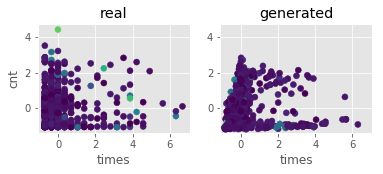

Step: 14100 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0122, 0.0206, 0.0226, 0.9500
D Real - D Gen: 0.0020


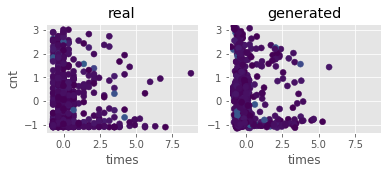

Step: 14200 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.1244, 0.1562, 0.1601, 0.9560
D Real - D Gen: 0.0039


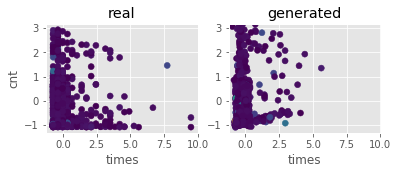

Step: 14300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1052, -0.1520, -0.1435, 0.9580
D Real - D Gen: 0.0085


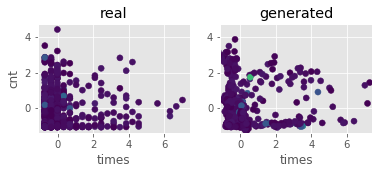

Step: 14400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0775, -0.0822, -0.0744, 0.9560
D Real - D Gen: 0.0078


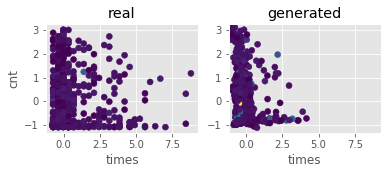

Step: 14500 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0319, 0.0335, 0.0279, 0.9640
D Real - D Gen: -0.0056


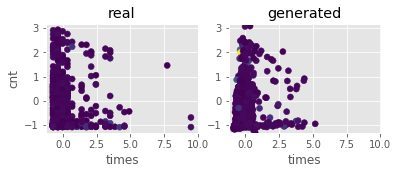

Step: 14600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0182, -0.0029, -0.0631, 0.9690
D Real - D Gen: -0.0602


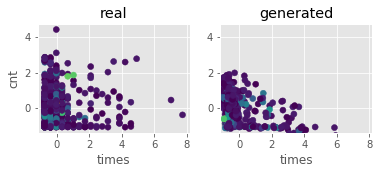

Step: 14700 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0060, 0.0234, 0.0316, 0.9460
D Real - D Gen: 0.0083


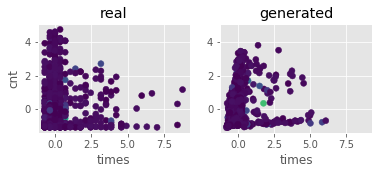

Step: 14800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0939, -0.0777, -0.0683, 0.9530
D Real - D Gen: 0.0094


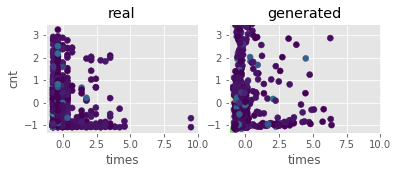

Step: 14900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0344, -0.0692, -0.0604, 0.9550
D Real - D Gen: 0.0088


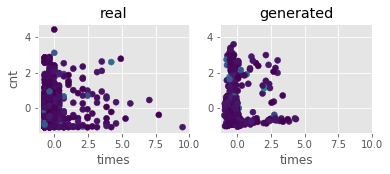

Step: 15000 of 25001.
Losses: G, D Gen, D Real, Xgb: -0.0347, 0.0470, 0.0332, 0.9450
D Real - D Gen: -0.0138


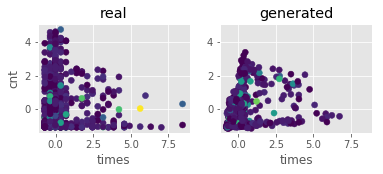

Step: 15100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0429, -0.0323, -0.0225, 0.9680
D Real - D Gen: 0.0098


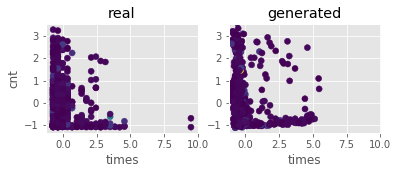

Step: 15200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2021, -0.2070, -0.1768, 0.9550
D Real - D Gen: 0.0302


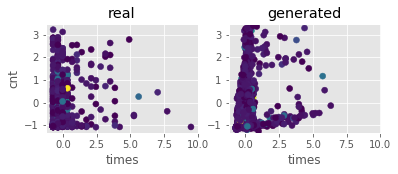

Step: 15300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1843, -0.1494, -0.1275, 0.9630
D Real - D Gen: 0.0218


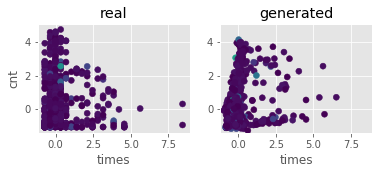

Step: 15400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0831, -0.0826, -0.0628, 0.9360
D Real - D Gen: 0.0198


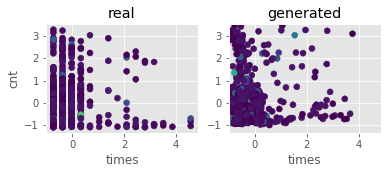

Step: 15500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0997, -0.0734, -0.0830, 0.9660
D Real - D Gen: -0.0096


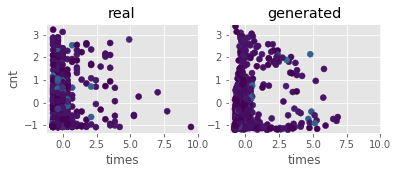

Step: 15600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0963, -0.0986, -0.0939, 0.9540
D Real - D Gen: 0.0047


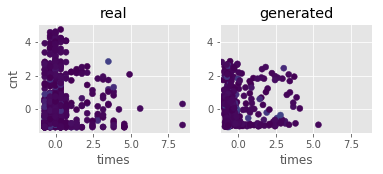

Step: 15700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0228, -0.0132, -0.0332, 0.9530
D Real - D Gen: -0.0199


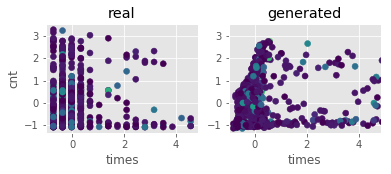

Step: 15800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1648, -0.1804, -0.1736, 0.9530
D Real - D Gen: 0.0069


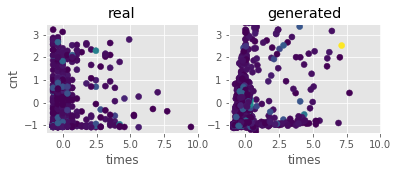

Step: 15900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1471, -0.1380, -0.1771, 0.9550
D Real - D Gen: -0.0391


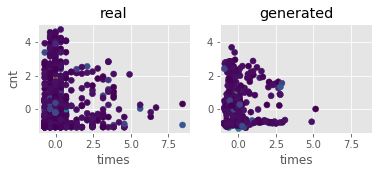

Step: 16000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0512, -0.0679, -0.0550, 0.9720
D Real - D Gen: 0.0129


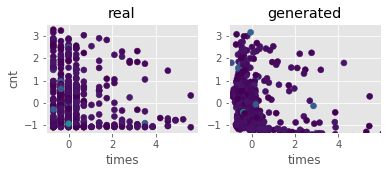

Step: 16100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2203, -0.1956, -0.1873, 0.9580
D Real - D Gen: 0.0082


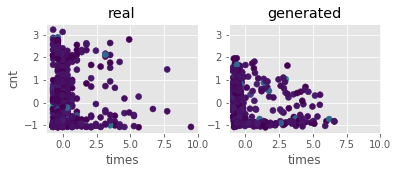

Step: 16200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0962, -0.0799, -0.0999, 0.9840
D Real - D Gen: -0.0200


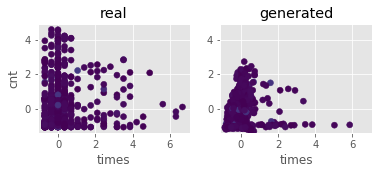

Step: 16300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1942, -0.1692, -0.1539, 0.9150
D Real - D Gen: 0.0154


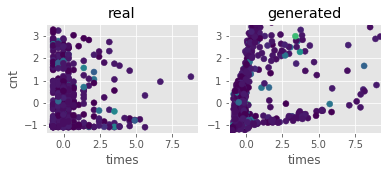

Step: 16400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1226, -0.0932, -0.0916, 0.9490
D Real - D Gen: 0.0016


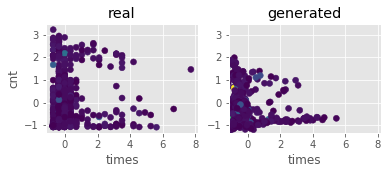

Step: 16500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1389, -0.1312, -0.1099, 0.9340
D Real - D Gen: 0.0213


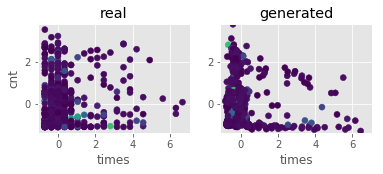

Step: 16600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1909, -0.1797, -0.1834, 0.9350
D Real - D Gen: -0.0037


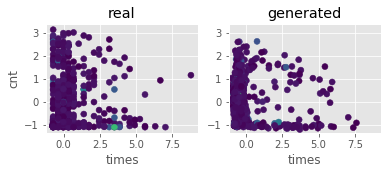

Step: 16700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2319, -0.2328, -0.2386, 0.9650
D Real - D Gen: -0.0058


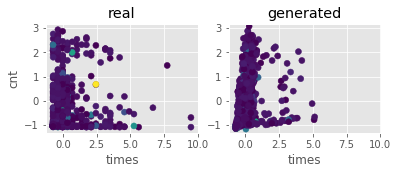

Step: 16800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2057, -0.2083, -0.1974, 0.9310
D Real - D Gen: 0.0109


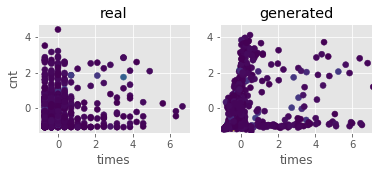

Step: 16900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1946, -0.2222, -0.2176, 0.9490
D Real - D Gen: 0.0046


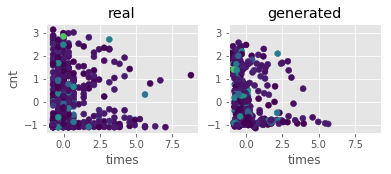

Step: 17000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0342, -0.0314, -0.0426, 0.9690
D Real - D Gen: -0.0112


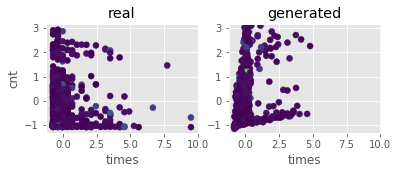

Step: 17100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1650, -0.1525, -0.1521, 0.9590
D Real - D Gen: 0.0004


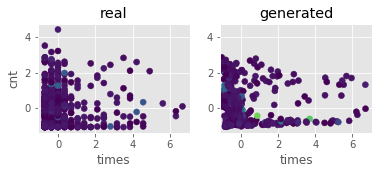

Step: 17200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0625, -0.0755, -0.0689, 0.9700
D Real - D Gen: 0.0066


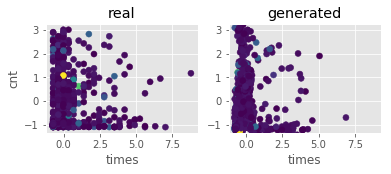

Step: 17300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0711, -0.0718, -0.0594, 0.9600
D Real - D Gen: 0.0124


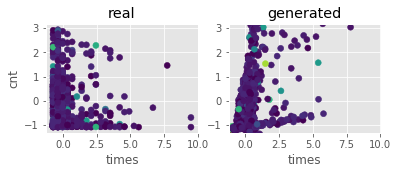

Step: 17400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1905, -0.1708, -0.1713, 0.9570
D Real - D Gen: -0.0005


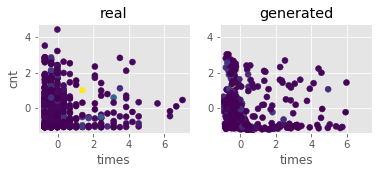

Step: 17500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1865, -0.1908, -0.2027, 0.9790
D Real - D Gen: -0.0119


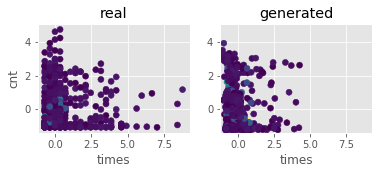

Step: 17600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2757, -0.2646, -0.2874, 0.9610
D Real - D Gen: -0.0228


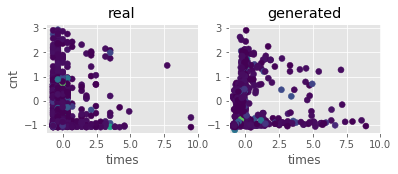

Step: 17700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2185, -0.2284, -0.2283, 0.9590
D Real - D Gen: 0.0002


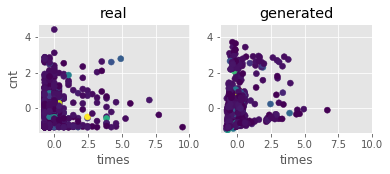

Step: 17800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1038, -0.0943, -0.0947, 0.9670
D Real - D Gen: -0.0004


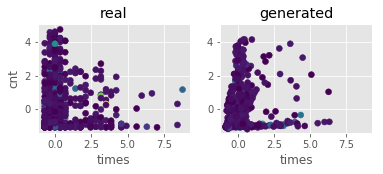

Step: 17900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3285, -0.2956, -0.2883, 0.9770
D Real - D Gen: 0.0074


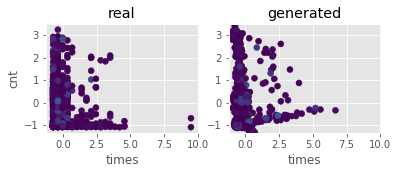

Step: 18000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1729, -0.1764, -0.1601, 0.9610
D Real - D Gen: 0.0163


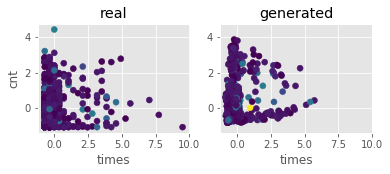

Step: 18100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2064, -0.1967, -0.1911, 0.9320
D Real - D Gen: 0.0056


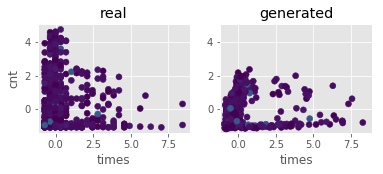

Step: 18200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2104, -0.2266, -0.2136, 0.9460
D Real - D Gen: 0.0131


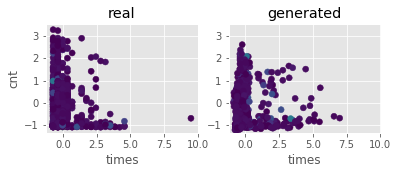

Step: 18300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1039, -0.0640, -0.1065, 0.9530
D Real - D Gen: -0.0425


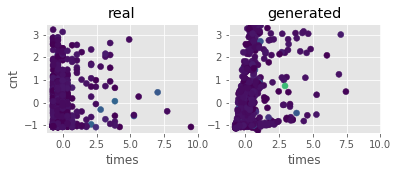

Step: 18400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3078, -0.3268, -0.3228, 0.9410
D Real - D Gen: 0.0040


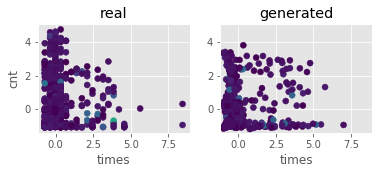

Step: 18500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2567, -0.2526, -0.2466, 0.9670
D Real - D Gen: 0.0060


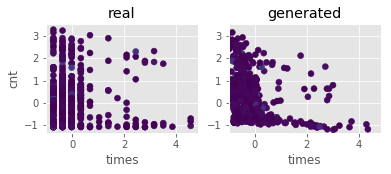

Step: 18600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1880, -0.1784, -0.1855, 0.9680
D Real - D Gen: -0.0071


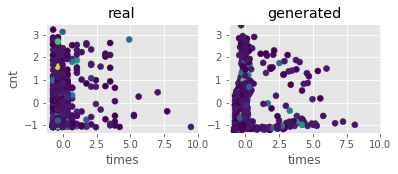

Step: 18700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1792, -0.1900, -0.2336, 0.9540
D Real - D Gen: -0.0437


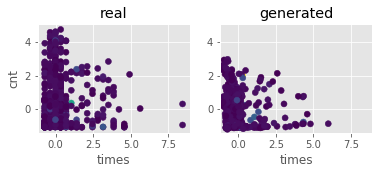

Step: 18800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1531, -0.1574, -0.1079, 0.9440
D Real - D Gen: 0.0495


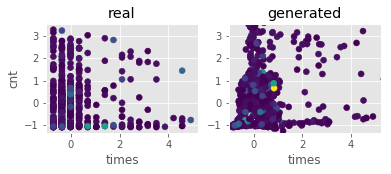

Step: 18900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1688, -0.1705, -0.1751, 0.9520
D Real - D Gen: -0.0046


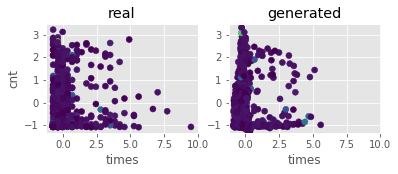

Step: 19000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1143, -0.1004, -0.1052, 0.9560
D Real - D Gen: -0.0048


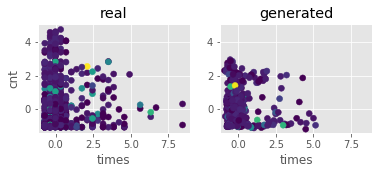

Step: 19100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1134, -0.1028, -0.1355, 0.9250
D Real - D Gen: -0.0327


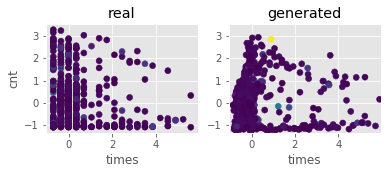

Step: 19200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2476, -0.2263, -0.2042, 0.9650
D Real - D Gen: 0.0222


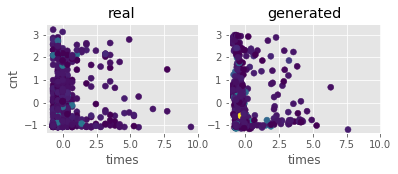

Step: 19300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1747, -0.1942, -0.1793, 0.9600
D Real - D Gen: 0.0149


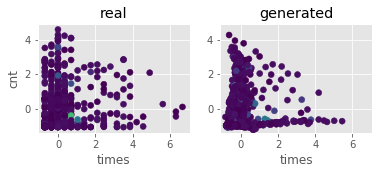

Step: 19400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2331, -0.2322, -0.2330, 0.9150
D Real - D Gen: -0.0008


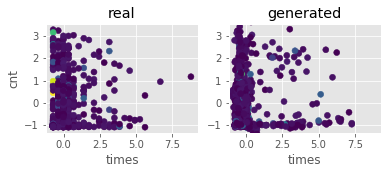

Step: 19500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1688, -0.1504, -0.1419, 0.9610
D Real - D Gen: 0.0085


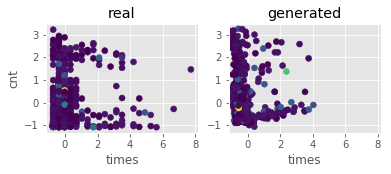

Step: 19600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1674, -0.1842, -0.1239, 0.9130
D Real - D Gen: 0.0603


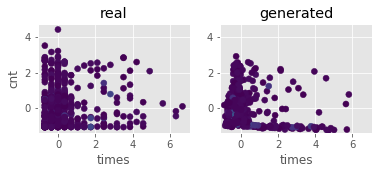

Step: 19700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2902, -0.2585, -0.2700, 0.9580
D Real - D Gen: -0.0115


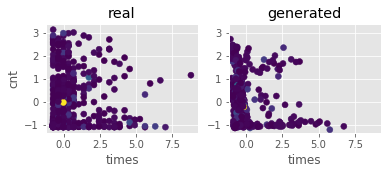

Step: 19800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2184, -0.2350, -0.2273, 0.9540
D Real - D Gen: 0.0077


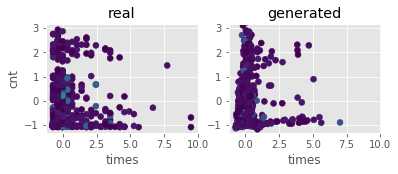

Step: 19900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2735, -0.2523, -0.2481, 0.9710
D Real - D Gen: 0.0042


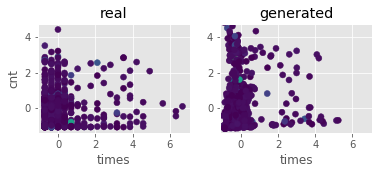

Step: 20000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1874, -0.1913, -0.2021, 0.9700
D Real - D Gen: -0.0108


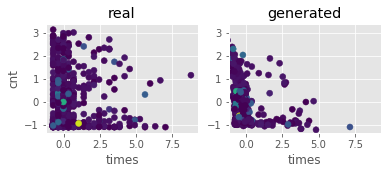

Step: 20100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2257, -0.2232, -0.2080, 0.9650
D Real - D Gen: 0.0152


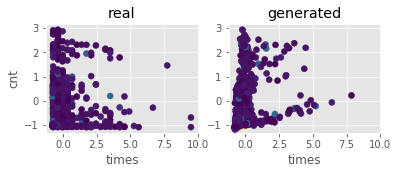

Step: 20200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3011, -0.3272, -0.3183, 0.9570
D Real - D Gen: 0.0090


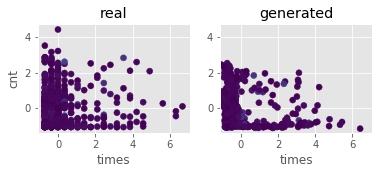

Step: 20300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3118, -0.2793, -0.2822, 0.9410
D Real - D Gen: -0.0029


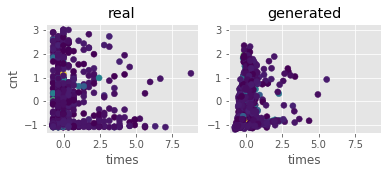

Step: 20400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3282, -0.3012, -0.3438, 0.9660
D Real - D Gen: -0.0426


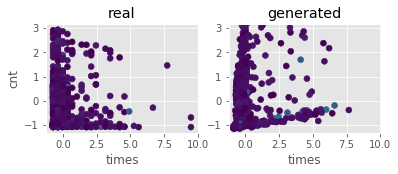

Step: 20500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2303, -0.2484, -0.2581, 0.9570
D Real - D Gen: -0.0097


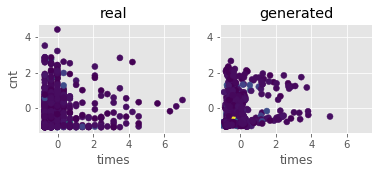

Step: 20600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2333, -0.2820, -0.2773, 0.9370
D Real - D Gen: 0.0046


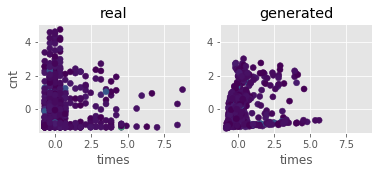

Step: 20700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2082, -0.2213, -0.2196, 0.9470
D Real - D Gen: 0.0017


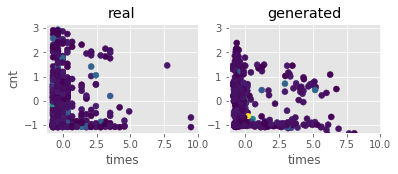

Step: 20800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1847, -0.1874, -0.1919, 0.9630
D Real - D Gen: -0.0046


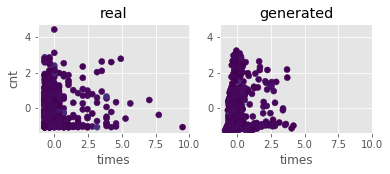

Step: 20900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1831, -0.1766, -0.1607, 0.9620
D Real - D Gen: 0.0159


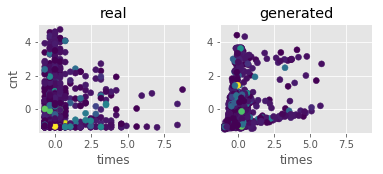

Step: 21000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2856, -0.2762, -0.2966, 0.9760
D Real - D Gen: -0.0204


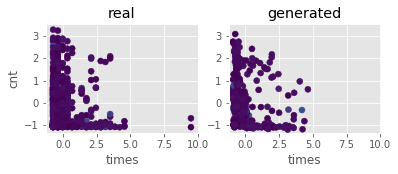

Step: 21100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2441, -0.2537, -0.2300, 0.9360
D Real - D Gen: 0.0236


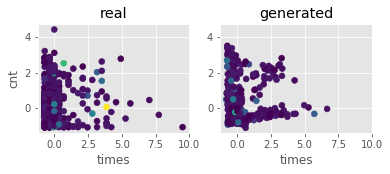

Step: 21200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2712, -0.2448, -0.2547, 0.9590
D Real - D Gen: -0.0099


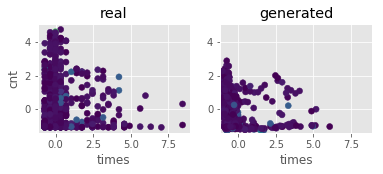

Step: 21300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1519, -0.1653, -0.1792, 0.9640
D Real - D Gen: -0.0139


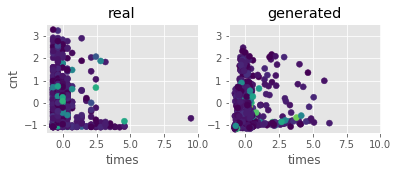

Step: 21400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0943, -0.0917, -0.0823, 0.9400
D Real - D Gen: 0.0095


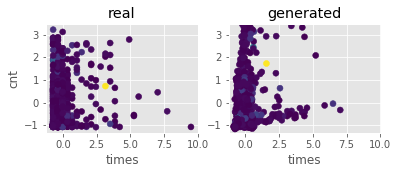

Step: 21500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1219, -0.1134, -0.1147, 0.9700
D Real - D Gen: -0.0012


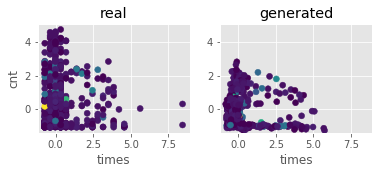

Step: 21600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1448, -0.0971, -0.0533, 0.9590
D Real - D Gen: 0.0438


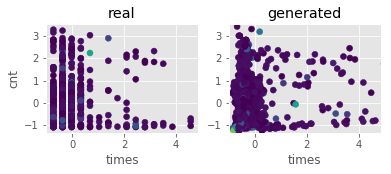

Step: 21700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0942, -0.0808, -0.0996, 0.9360
D Real - D Gen: -0.0188


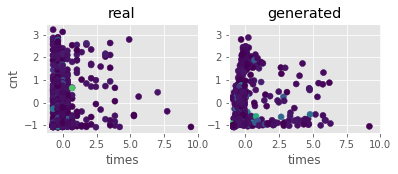

Step: 21800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0750, -0.0569, -0.0366, 0.9530
D Real - D Gen: 0.0203


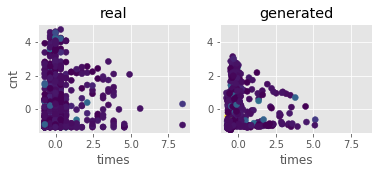

Step: 21900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0088, -0.0125, -0.0275, 0.9310
D Real - D Gen: -0.0150


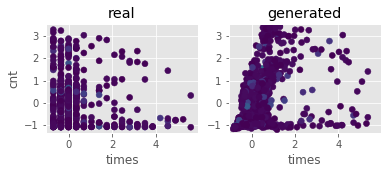

Step: 22000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2298, -0.2509, -0.2470, 0.9570
D Real - D Gen: 0.0039


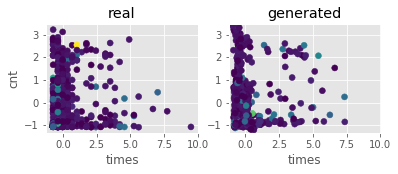

Step: 22100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2814, -0.2719, -0.2757, 0.9680
D Real - D Gen: -0.0037


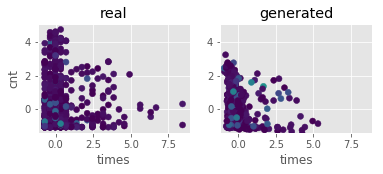

Step: 22200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3460, -0.3473, -0.3440, 0.9470
D Real - D Gen: 0.0034


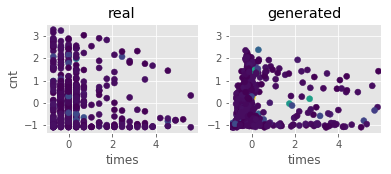

Step: 22300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1943, -0.1853, -0.1691, 0.9770
D Real - D Gen: 0.0162


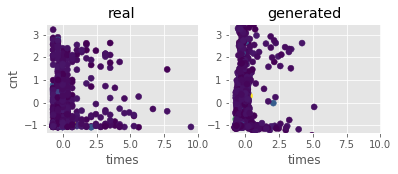

Step: 22400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0314, -0.0217, -0.0516, 0.9440
D Real - D Gen: -0.0299


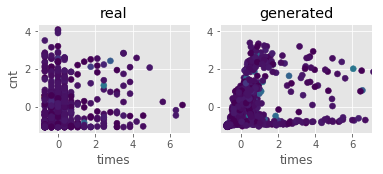

Step: 22500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2988, -0.3061, -0.2905, 0.9300
D Real - D Gen: 0.0156


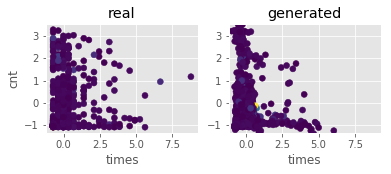

Step: 22600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2527, -0.3011, -0.2890, 0.9580
D Real - D Gen: 0.0120


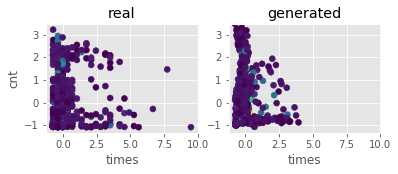

Step: 22700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1217, -0.1292, -0.1221, 0.9310
D Real - D Gen: 0.0070


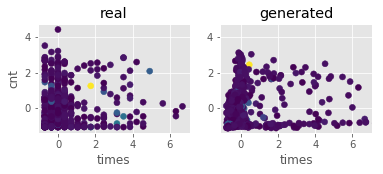

Step: 22800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1030, -0.1366, -0.1328, 0.9620
D Real - D Gen: 0.0038


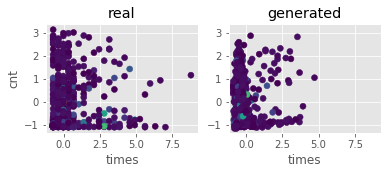

Step: 22900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.0171, 0.0156, 0.0582, 0.9620
D Real - D Gen: 0.0425


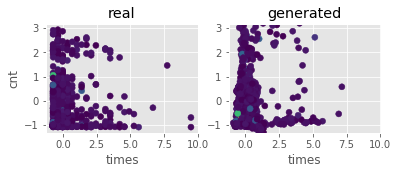

Step: 23000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3243, -0.2722, -0.2705, 0.9620
D Real - D Gen: 0.0017


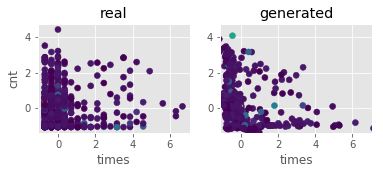

Step: 23100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2486, -0.2473, -0.2450, 0.9660
D Real - D Gen: 0.0023


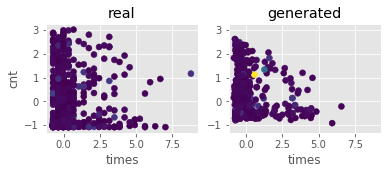

Step: 23200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1493, -0.1815, -0.1928, 0.9390
D Real - D Gen: -0.0114


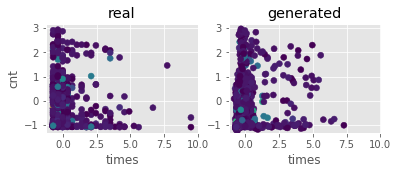

Step: 23300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1757, -0.1511, -0.1877, 0.9500
D Real - D Gen: -0.0366


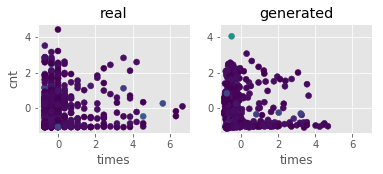

Step: 23400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1820, -0.2028, -0.2389, 0.9440
D Real - D Gen: -0.0361


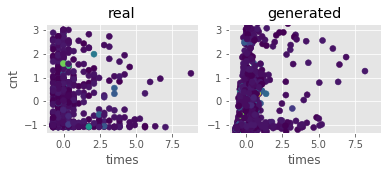

Step: 23500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1860, -0.1734, -0.1613, 0.9680
D Real - D Gen: 0.0121


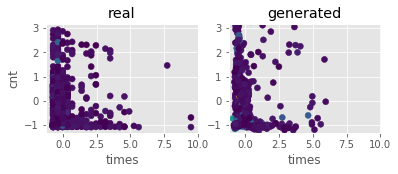

Step: 23600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2182, -0.1710, -0.1793, 0.9640
D Real - D Gen: -0.0083


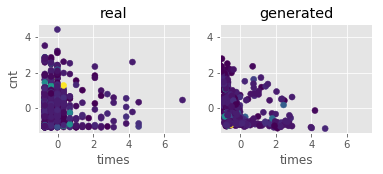

Step: 23700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1614, -0.1583, -0.1926, 0.9590
D Real - D Gen: -0.0343


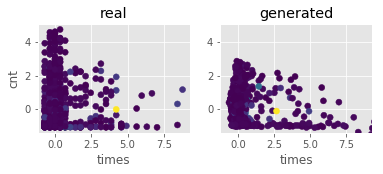

Step: 23800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2872, -0.2767, -0.2421, 0.9560
D Real - D Gen: 0.0345


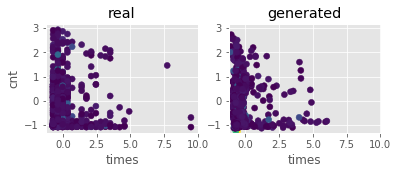

Step: 23900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2021, -0.2120, -0.1912, 0.9500
D Real - D Gen: 0.0208


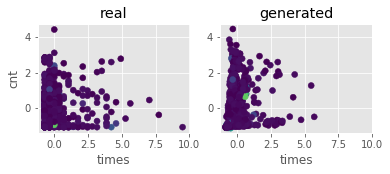

Step: 24000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3270, -0.3347, -0.3127, 0.9580
D Real - D Gen: 0.0220


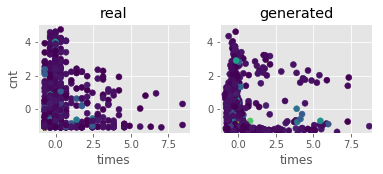

Step: 24100 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3674, -0.3628, -0.3499, 0.9730
D Real - D Gen: 0.0129


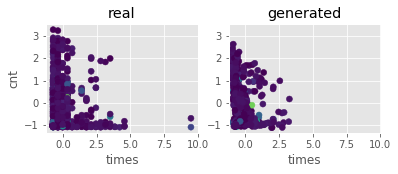

Step: 24200 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2620, -0.2608, -0.2679, 0.9430
D Real - D Gen: -0.0071


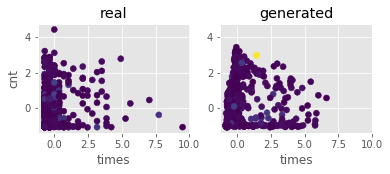

Step: 24300 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3208, -0.3301, -0.3386, 0.9570
D Real - D Gen: -0.0086


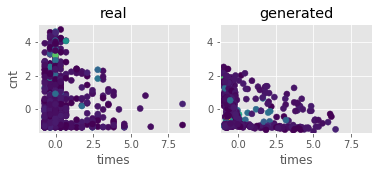

Step: 24400 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2257, -0.1849, -0.2075, 0.9590
D Real - D Gen: -0.0226


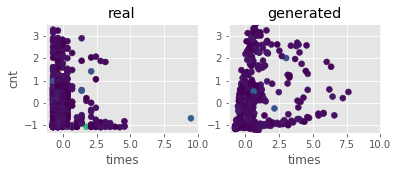

Step: 24500 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3216, -0.3253, -0.3760, 0.9490
D Real - D Gen: -0.0507


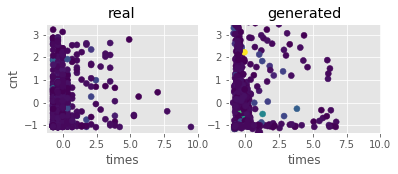

Step: 24600 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2374, -0.2412, -0.2817, 0.9620
D Real - D Gen: -0.0405


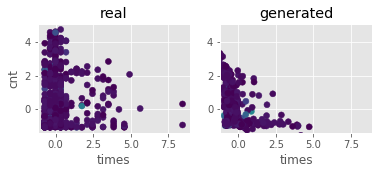

Step: 24700 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.1309, -0.1251, -0.1269, 0.9540
D Real - D Gen: -0.0018


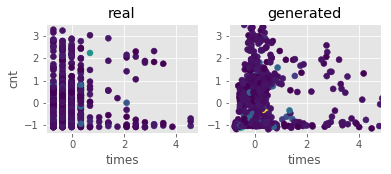

Step: 24800 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.2433, -0.2377, -0.2458, 0.9700
D Real - D Gen: -0.0081


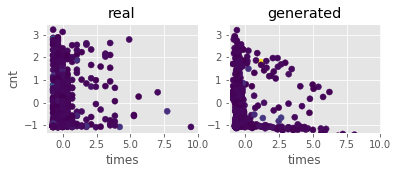

Step: 24900 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3219, -0.3054, -0.3167, 0.9610
D Real - D Gen: -0.0113


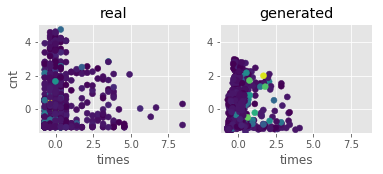

Step: 25000 of 25001.
Losses: G, D Gen, D Real, Xgb: 0.3236, -0.3237, -0.3088, 0.9220
D Real - D Gen: 0.0149


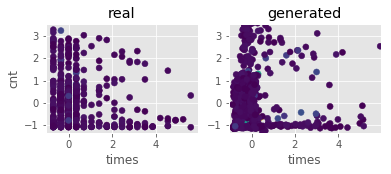

Finish training GAN
CPU times: user 1h 36min 36s, sys: 4min 40s, total: 1h 41min 16s
Wall time: 25min 14s


In [3]:
#%%time
# Arguments
rand_dim = 32                       # needs to be ~data_dim
base_n_count = 128
nb_steps = 25000 + 1                # Add one for logging of the last interval
batch_size = 64
k_d = 5                             # number of critic network updates per adversarial training step
k_g = 1                             # number of generator network updates per adversarial training step
critic_pre_train_steps = 100        # number of steps to pre-train the critic before starting adversarial training
log_interval = 100                  # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 1e-4                # WGAN: 5e-5, WGAN-GP: 1e-4, CGAN: 2e-4
data_dir = 'cache/'
if not os.path.isdir(data_dir):
    os.mkdir(data_dir)              # check dir is exist
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

show = True                        # choose whether to show the traing img

random_subset = fraud_w_classes.copy().reset_index(drop=True)                               # fraud only with labels from classification, reset the index
arguments = [rand_dim, nb_steps, batch_size, k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
             data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show]
arguments[1] = 25001
arguments[2] = 64

# Four GANs
# adversarial_training_GAN(arguments, random_subset, data_cols=data_cols)                             # GAN
# adversarial_training_WGAN(arguments, train, data_cols=data_cols)                                    # WGAN
# adversarial_training_InfoGAN(arguments, train, data_cols=data_cols)                                 # InfoGAN
# adversarial_training_GAN(arguments, random_subset, data_cols=data_cols, label_cols=label_cols)      # CGAN
label_cols = ['ret_cnt', 'ret_times']
adversarial_training_WGAN(arguments, train, train_o, data_cols=data_cols, label_cols=label_cols)             # WCGAN
print('Finish training GAN')

In [4]:
# Let's look at some of the generated data
# First create the networks locally and load the weights
print('Create networks')
seed = 17
data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = True if label_dim > 0 else False
# with_class = False
np.random.seed(seed)

# Define four network models
# with class
generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type='Wasserstein')
generator_model.load_weights('cache/WCGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
# generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
# generator_model.load_weights('cache/CGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')

# with_class = False
# train = train_no_label
# label_cols = []
# generator_model, discriminator_model, combined_model = define_models_GAN(rand_dim, data_dim, base_n_count, type='Wasserstein')
# generator_model.load_weights('cache/WGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
# generator_model, discriminator_model, combined_model = define_models_GAN(rand_dim, data_dim, base_n_count)
# generator_model.load_weights('cache/GAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
# generator_model, discriminator_model, combined_model = define_models_InfoGAN(rand_dim, data_dim, base_n_count)
# generator_model.load_weights('cache/InfoGAN_generator_model_weights_step_' + str(nb_steps - 1) + '.h5')
print('-------------------------')


Create networks
-------------------------


Generate new data and result


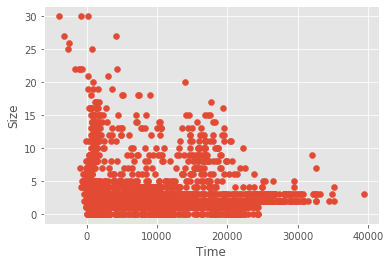

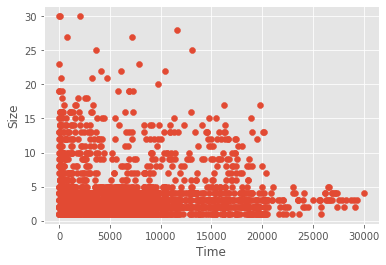

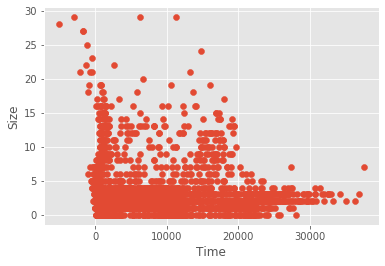

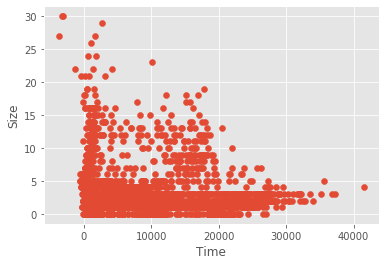

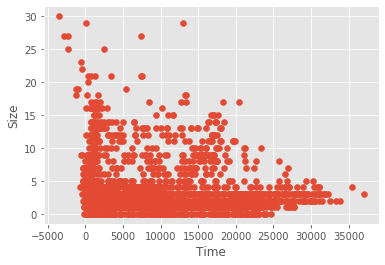

...

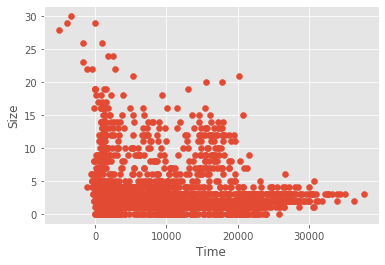

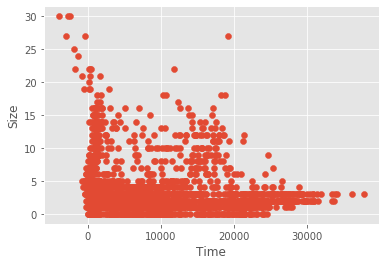

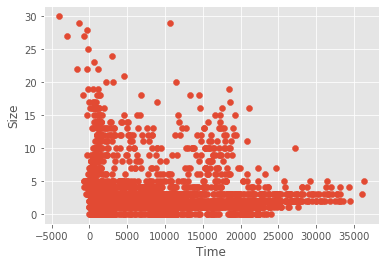

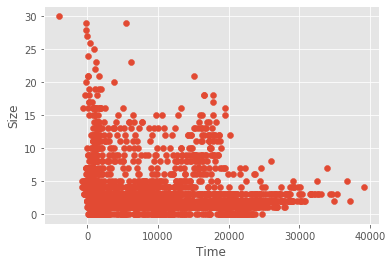

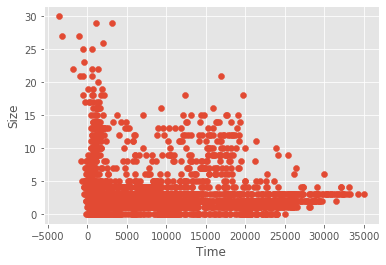

-------------------------


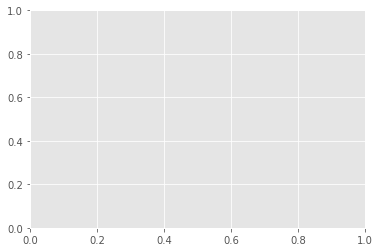

In [5]:
# Now generate some new data
print('Generate new data and result')
test_size = int(dataSample.values.shape[0])             # Equal to all of the fraud cases, dataSample: 1554, test_size: 518

# generate some data and use generator to get result
x = get_data_batch(train, test_size, seed=seed)
z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = x[:, :1]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

# denormailize the generator's result
result = g_z.copy()
# print(labels)
# print(result)
result[:, 0] *= dataSample.std()[0]
result[:, 0] += dataSample.mean()[0]

result[:, 1] *= dataSample.std()[1]
result[:, 1] += dataSample.mean()[1]

b = result[:, 0].astype('int').reshape(-1, 1)
c = result[:, 1].astype('float64').reshape(-1, 1)
result = np.concatenate((b, c), axis=1)

np.set_printoptions(suppress=True, formatter={'float_kind':'{:0.6f}'.format}) # setting print floating point numbers, and print format

x1 = result[:, 1]
y1 = result[:, 0]

# Remove maxima value
# for i in list(np.where(y1 > 95)):
#     x1 = np.delete(x1, i)
#     y1 = np.delete(y1, i)

# print the generator data pic
plt.scatter(x1, y1)
plt.xlabel('Time')
plt.ylabel('Size')
save_name = data_dir + 'generator_fig' + '.png'
plt.savefig(save_name)
plt.show()
plt.cla()

# print the original data figure
origin = dataSample.values.copy()
x2 = origin[:, 1]
y2 = origin[:, 0]
plt.scatter(x2, y2)
plt.xlabel('Time')
plt.ylabel('Size')
save_name = data_dir + 'original_fig' + '.png'
plt.savefig(save_name)
plt.show()
plt.cla()

# show_info(x1, y1)
# show_info(x2, y2)

# generate some data and use generator to get result
# run 10 times to generate data and result
for i in range(10):
    np.random.seed(i)
    z = np.random.normal(size=(test_size, rand_dim))
    if with_class:
        labels = x[:,:1]
        g_z = generator_model.predict([z, labels])
    else:
        g_z = generator_model.predict(z)

    # denormailize the generator's result
    result = g_z.copy()
    result[:, 0] *= dataSample.std()[0]
    result[:, 0] += dataSample.mean()[0]

    result[:, 1] *= dataSample.std()[1]
    result[:, 1] += dataSample.mean()[1]

    b = result[:, 0].astype('int').reshape(-1, 1)
    c = result[:, 1].astype('float64').reshape(-1, 1)

    result = np.concatenate((b, c), axis=1)

    x1 = result[:, 1]
    y1 = result[:, 0]
    '''
    for i in list(np.where(x1 < 5800)):
        y1 = np.delete(y1, i)
        x1 = np.delete(x1, i)
    '''
#     for j in list(np.where(y1 > 95)):
#         y1 = np.delete(y1, j)
#         x1 = np.delete(x1, j)

    # print the generate data figure
    plt.scatter(x1, y1)
    plt.xlabel('Time')
    plt.ylabel('Size')
    save_name = data_dir + 'result_' + str(i + 1) + '_fig' + '.png'
    plt.savefig(save_name)
    plt.show()
    plt.cla()
print('-------------------------')

Load model
Find best xgb scores overall and saved
WCGAN step 21470: 0.9190
WCGAN step 11200: 0.9280

Look at the unsmoothed losses
0


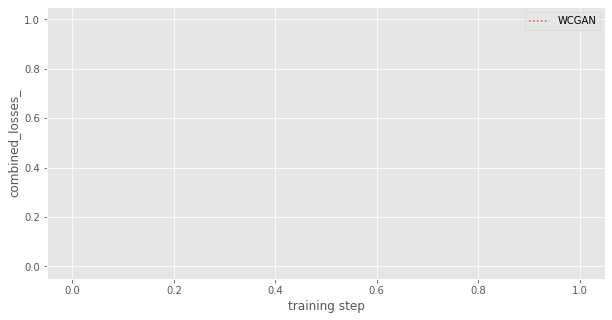

0


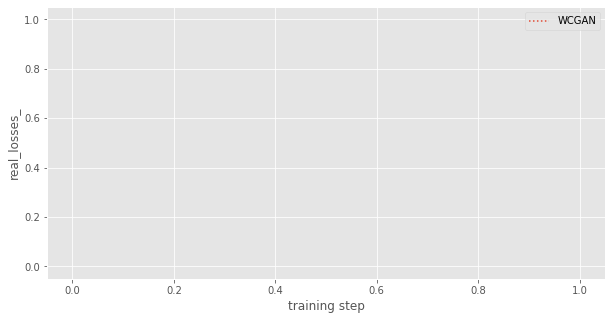

0


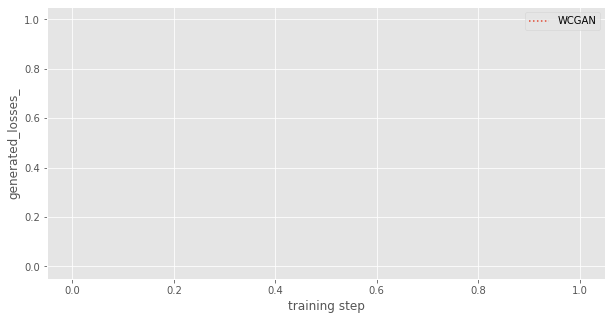

0


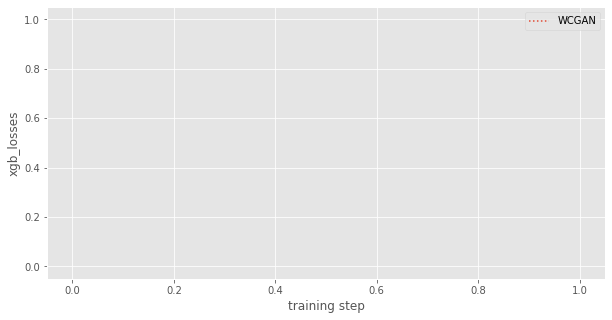

100


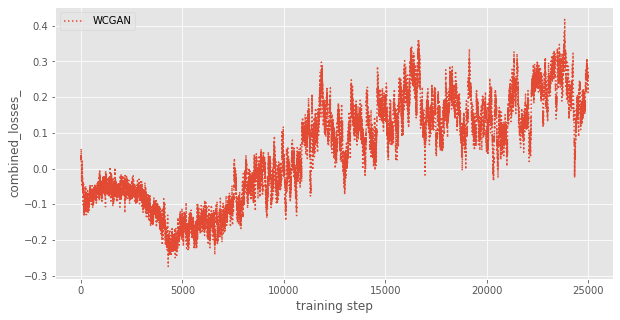

100


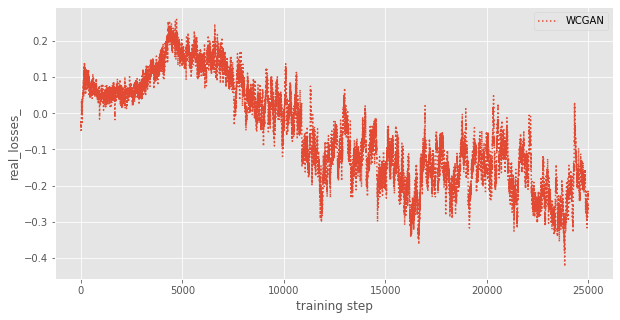

100


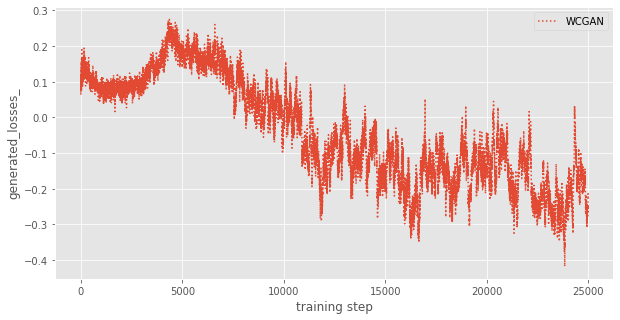

100


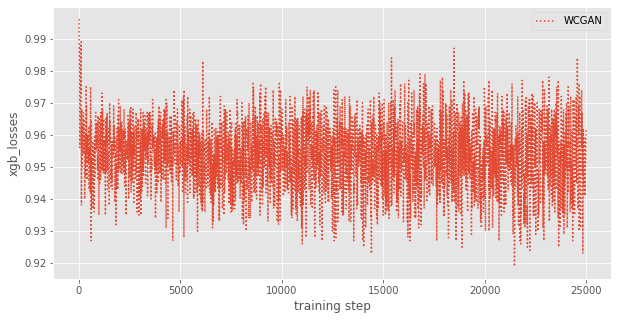

In [6]:
import gan_func
importlib.reload(gan_func)  # For reloading after making changes
from gan_func import *
# load model
print('Load model')
base_dir = 'cache/'
suffix = '_step_' + str(nb_steps - 1)

# separate be combined_loss, disc_loss_real, disc_loss_generated, xgb_losses
# GAN_losses = pickle.load(open(base_dir + 'GAN_losses' + suffix + '.pkl', 'rb'))
# CGAN_losses = pickle.load(open(base_dir + 'CGAN_losses' + suffix + '.pkl', 'rb'))
# WGAN_losses = pickle.load(open(base_dir + 'WGAN_losses' + suffix + '.pkl', 'rb'))
WCGAN_losses = pickle.load(open(base_dir + 'WCGAN_losses' + suffix + '.pkl', 'rb'))

# linestyles = ['-', '--', '-.', ':']
losses = WCGAN_losses
label = 'WCGAN'
linestyle = ':'

# Find best xgb scores overall and saved (every 100 steps)
print('Find best xgb scores overall and saved')

data_ix = 3
# data_sets = [GAN_losses[data_ix], CGAN_losses[data_ix], WGAN_losses[data_ix], WCGAN_losses[data_ix]]
# labels = ['GAN', 'CGAN', 'WGAN', 'WCGAN']
data_set = losses[data_ix]

best_step = list(data_set).index(np.array(data_set).min()) * 10
print('{: <5} step {: <4}: {:.4f}'.format(label, best_step, np.array(data_set).min()))

xgb100 = [data_set[i] for i in range(0, len(data_set), 10)]
best_step = xgb100.index(min(xgb100)) * 100
print('{: <5} step {: <4}: {:.4f}\n'.format(label, best_step, np.array(xgb100).min()))
# print(best_step, min(xgb100))


# Look at the unsmoothed losses
print('Look at the unsmoothed losses')
unsmoothed_losses(losses, label, linestyle)
unsmoothed_losses(losses, label, linestyle, 100)

Create a figure for the critic losses for the WGAN


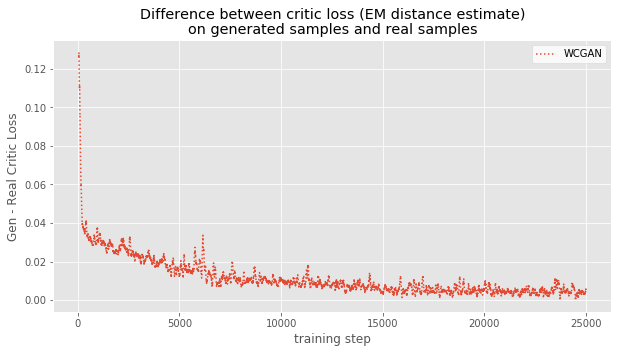

In [7]:
# Create a figure for the critic losses for the WGAN and WCGAN
print('Create a figure for the critic losses for the WGAN')
w = 50       # Size of the moving window. This is the number of observations used for calculating the statistic.
data_ix0 = 2 # generated_losses_
data_ix1 = 1 # real_losses_
# data_fields = ['combined_losses_', 'real_losses_', 'generated_losses_', 'xgb_losses']

# labels = ['GAN','CGAN','WGAN','WCGAN'][1:3]
# data_sets0 = [GAN_losses[data_ix0], CGAN_losses[data_ix0], WGAN_losses[data_ix0], WCGAN_losses[data_ix0]][1:3]
# data_sets1 = [GAN_losses[data_ix1], CGAN_losses[data_ix1], WGAN_losses[data_ix1], WCGAN_losses[data_ix1]][1:3]
# linestyles = ['-', '--', '-.', ':'][1:3]

plt.figure(figsize=(10, 5))
data0 = losses[data_ix0]
data1 = losses[data_ix1]
plt.plot(range(0, len(data0)), pd.DataFrame(np.array(data0) - np.array(data1)).rolling(w).mean(), label=label, linestyle=linestyle)
plt.title('Difference between critic loss (EM distance estimate)\non generated samples and real samples')
plt.xlabel('training step')
plt.ylabel('Gen - Real Critic Loss')
legend = plt.legend() 
legend.get_frame().set_facecolor('white')
plt.savefig('cache/Delta_critic_loss_plot.png')

# save result
np.savetxt('result.txt', result, newline='\n', fmt='%0.2f')